In [1]:
# mount drive to work with google drive
# Mount Google Drive
from google.colab import drive
import os
drive.mount('/content/drive/', force_remount=True)
%cd /content
os.chdir('/content/drive/MyDrive/AAAI/') #path was adjusted manually

Mounted at /content/drive/
/content


1. **Background Subtraction**:
   - If you're working with a video stream, first apply a background subtraction algorithm. This will give you the foreground objects in each frame. Tools like OpenCV have functions like `createBackgroundSubtractorMOG2()` for this.

## **Show the original GIF**

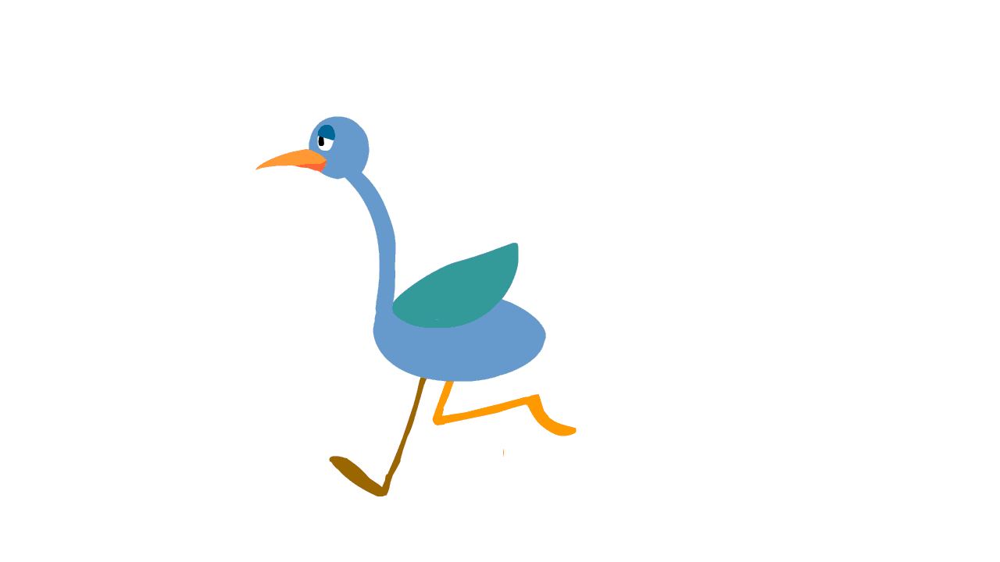

In [2]:
from IPython.display import display, Image

# Path to the GIF in Google Drive
input_gif_path = "/content/drive/MyDrive/AAAI/bird.gif"

# Display the GIF
with open(input_gif_path, "rb") as f:
    display(Image(data=f.read(), format='png'))


## **Split into Frames, count them**

28


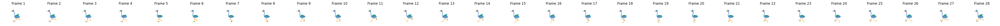

In [5]:
import cv2
import numpy as np
from PIL import Image, ImageSequence
import matplotlib.pyplot as plt
import os

# Directory for saving the frames
save_directory = "/content/drive/MyDrive/AAAI/original_bird"
if not os.path.exists(save_directory):
    os.makedirs(save_directory)

# Load the GIF
input_gif_path = "/content/drive/MyDrive/AAAI/bird.gif"
img = Image.open(input_gif_path)
frames = [frame.copy() for frame in ImageSequence.Iterator(img)]
print(len(frames))
# Save frames
saved_paths = []
for idx, frame in enumerate(frames):
    save_path = os.path.join(save_directory, f"frame_{idx + 1}.png")
    frame.save(save_path)
    saved_paths.append(save_path)

# Display the first three saved frames
fig, axes = plt.subplots(1, (len(frames)), figsize=(50, 30))
for i, ax in enumerate(axes):
    if i < len(saved_paths):
        ax.imshow(plt.imread(saved_paths[i]))
        ax.set_title(f"Frame {i + 1}")
        ax.axis('off')
plt.tight_layout()
plt.show()

**Dublicate first 2 Frames**

In [6]:
import shutil

# Paths to the original frames
frame1_path = "/content/drive/MyDrive/AAAI/original_bird/frame_1.png"
frame2_path = "/content/drive/MyDrive/AAAI/original_bird/frame_2.png"

# Paths where you want to save the copies
frame29_path = "/content/drive/MyDrive/AAAI/original_bird/frame_" + str(len(frames) + 1) + ".png"
frame30_path = "/content/drive/MyDrive/AAAI/original_bird/frame_" + str(len(frames) + 2) + ".png"


# Copy the frames
shutil.copy(frame1_path, frame29_path)
shutil.copy(frame2_path, frame30_path)

print(f"Copied frame_1.png to {frame29_path}")
print(f"Copied frame_2.png to {frame30_path}")
# Create a new GIF using the modified frames list



Copied frame_1.png to /content/drive/MyDrive/AAAI/original_bird/frame_29.png
Copied frame_2.png to /content/drive/MyDrive/AAAI/original_bird/frame_30.png


# **Show all images in a folder function**

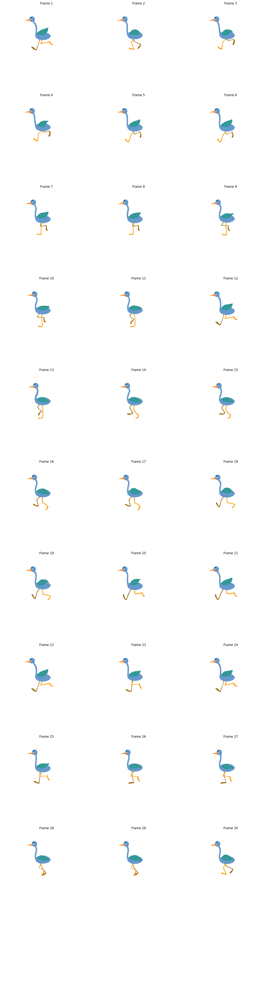

In [7]:
import os
from PIL import Image
import matplotlib.pyplot as plt

def display_pngs_from_folder(png_directory):
    """
    Display all PNG images from the specified directory.

    Parameters:
    - png_directory: Path to the directory containing PNG images.
    """

    # List of PNG files sorted by their names
    png_files = sorted([os.path.join(png_directory, f) for f in os.listdir(png_directory) if f.endswith('.png')])

    # Load PNGs into a list
    png_images = [Image.open(png_file) for png_file in png_files]

    # Display all the PNG frames
    fig, axes = plt.subplots(len(png_images) // 3 + 1, 3, figsize=(15, 5 * (len(png_images) // 3 + 1)))

    for i, ax in enumerate(axes.ravel()):
        if i < len(png_images):
            ax.imshow(png_images[i])
            ax.set_title(f"Frame {i + 1}")
            ax.axis('off')
        else:
            ax.axis('off')

    plt.tight_layout()
    plt.show()

# Example usage:
png_directory = "/content/drive/MyDrive/AAAI/original_bird/"
display_pngs_from_folder(png_directory)


# **Assemble all pngs from the folder into gif** - code suggested by Bard

In [8]:
import os
import imageio

def merge_pngs_to_gif(input_dir, output_file, delay=100):
    """Merges all PNGs in the input directory into a GIF file.

    Args:
    input_dir: The directory containing the PNG files.
    output_file: The path to the output GIF file.
    delay: The delay in milliseconds between each frame in the GIF.
    """

    # Get a list of all PNG files in the input directory.
    png_files = sorted([os.path.join(input_dir, f) for f in os.listdir(input_dir) if f.endswith('.png')])
    print(len(png_files))
    # Create a writer for the output GIF file.
    with imageio.get_writer(output_file, format='GIF', mode='I', duration=delay/1000) as writer:
        # Write each frame of the GIF file.
        for png_file in png_files:
            image = imageio.imread(png_file)
            writer.append_data(image)

# Example usage:
input_dir = '/content/drive/MyDrive/AAAI/original_bird/'
output_file = "/content/drive/MyDrive/AAAI/extendedbird.gif"

merge_pngs_to_gif(input_dir, output_file)



30


<ipython-input-8-b52d4ab4fa5f>:20: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(png_file)


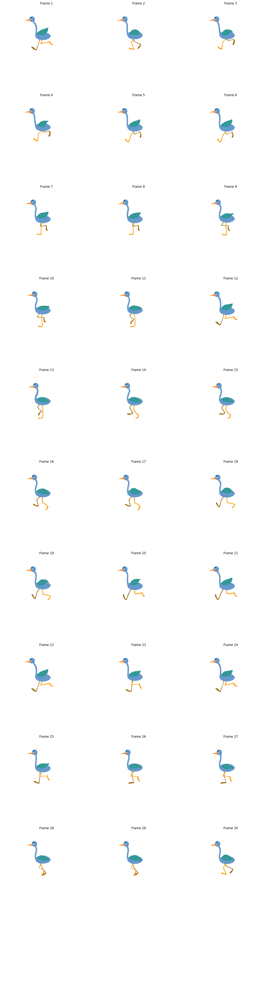

In [22]:
png_directory = "/content/drive/MyDrive/AAAI/original_bird/"
display_pngs_from_folder(png_directory)


In [23]:
# Load the GIF
input_gif_path = "/content/drive/MyDrive/AAAI/extendedbird.gif"
img = Image.open(input_gif_path)
frames = [frame.copy() for frame in ImageSequence.Iterator(img)]
print(len(frames))

30


## **Show extended gif**

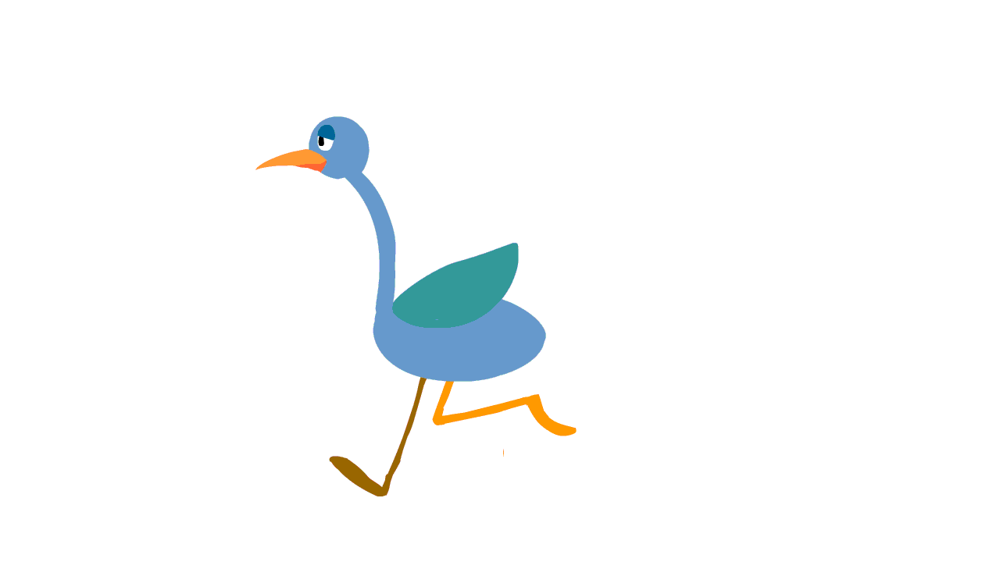

In [24]:
from IPython.display import display, Image

# Path to the GIF in Google Drive
input_gif_path = "/content/drive/MyDrive/AAAI/extendedbird.gif"

# Display the GIF
with open(input_gif_path, "rb") as f:
    display(Image(data=f.read(), format='png'))

# **Grey Scale Outline**

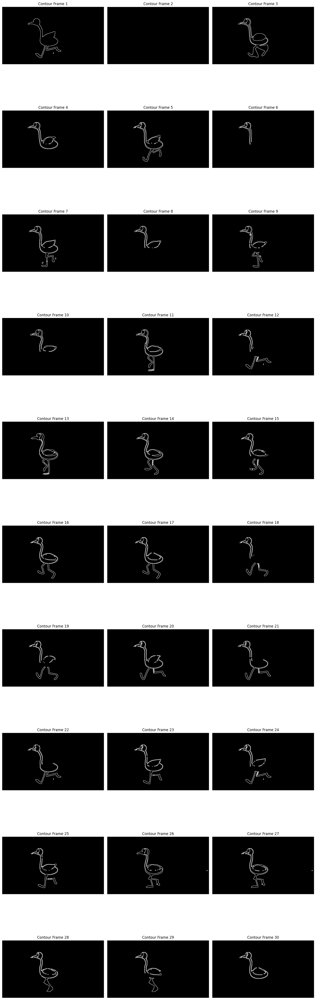

In [39]:
import cv2
import numpy as np
from PIL import Image, ImageSequence
import matplotlib.pyplot as plt

# Path to the GIF in Google Drive
input_gif_path =  "/content/drive/MyDrive/AAAI/extendedbird.gif"

# Load the GIF
img = Image.open(input_gif_path)
frames = [frame.copy() for frame in ImageSequence.Iterator(img)]

# Initialize the MOG2 background subtractor
fgbg = cv2.createBackgroundSubtractorMOG2()

# Process all frames in the GIF
all_foreground_frames = []

for frame in frames:
    # Convert PIL frame to numpy array
    frame_np = np.array(frame)

    # Convert RGBA to RGB (if needed)
    if frame_np.shape[-1] == 4:
        frame_np = cv2.cvtColor(frame_np, cv2.COLOR_RGBA2RGB)

    fgmask = fgbg.apply(frame_np)

    # Apply the mask to get the foreground
    foreground = cv2.bitwise_and(frame_np, frame_np, mask=fgmask)

    all_foreground_frames.append(foreground)

# Extract contours of the foreground objects for all frames
kernel = np.ones((3,3), np.uint8)  # Kernel for dilation
all_contour_frames = []

for frame in all_foreground_frames:
    # If the frame is already grayscale, skip the conversion
    if len(frame.shape) == 2 or frame.shape[2] == 1:
        gray_frame = frame
    else:
        # Convert RGB frame to grayscale
        gray_frame = cv2.cvtColor(frame, cv2.COLOR_RGB2GRAY)

    # Apply binary thresholding
    _, thresh = cv2.threshold(gray_frame, 1, 255, cv2.THRESH_BINARY)

    # Dilation to enhance the thickness of the contours
    dilated = cv2.dilate(thresh, kernel, iterations=2)

    # Find contours on the dilated image
    contours, _ = cv2.findContours(dilated, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Create an empty black image to draw contours on
    contour_image = np.zeros_like(gray_frame)

    # Draw contours with increased thickness
    cv2.drawContours(contour_image, contours, -1, 255, 2)  # Drawing in white color with thickness=2

    # Draw a rectangle around the entire image
    h, w = contour_image.shape
    cv2.rectangle(contour_image, (0, 0), (w-1, h-1), 255, 1)

    all_contour_frames.append(contour_image)

# Display all the contour frames
num_frames = len(all_contour_frames)
rows = (num_frames // 3) + int(num_frames % 3 > 0)
fig, ax = plt.subplots(rows, 3, figsize=(15, 5 * rows))

for i, contour_frame in enumerate(all_contour_frames):
    row = i // 3
    col = i % 3
    ax[row, col].imshow(contour_frame, cmap='gray')
    ax[row, col].axis('off')
    ax[row, col].set_title(f"Contour Frame {i + 1}")

# Turn off axes for any unused subplots
for i in range(num_frames, rows * 3):
    row = i // 3
    col = i % 3
    ax[row, col].axis('off')

plt.tight_layout()
plt.show()



The MOG2 background subtractor in OpenCV creates a binary mask (foreground mask) to distinguish between the foreground and the background. The mask** only has two **values:
0: Represents background pixels.
255: Represents foreground pixels.
Thus, the MOG2 background subtractor essentially distinguishes between the foreground and the background using a binary mask, so it has only two "colors" or values: 0 and 255. If you're referring to the resulting foreground image, then it retains the colors of the original image wherever the mask has a value of 255 and sets the pixels to black (or [0, 0, 0] in RGB) wherever the mask has a value of 0.

In [45]:
import cv2
import numpy as np
from PIL import Image, ImageSequence
import os

def extract_foreground_using_MOG2(input_gif_path, output_folder):
    # Check and create output directory if it doesn't exist
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    # Load the GIF
    img = Image.open(input_gif_path)
    frames = [frame.copy() for frame in ImageSequence.Iterator(img)]

    # Initialize the MOG2 background subtractor
    fgbg = cv2.createBackgroundSubtractorMOG2()

    # Process all frames in the GIF
    all_masks = []
    for frame in frames:
        frame_np = np.array(frame)
        if frame_np.shape[-1] == 4:
            frame_np = cv2.cvtColor(frame_np, cv2.COLOR_RGBA2RGB)
        fgmask = fgbg.apply(frame_np)
        all_masks.append(fgmask)

    # Kernel for dilation
    kernel = np.ones((3,3), np.uint8)

    # Extract contours of the foreground objects for all frames
    for idx, mask in enumerate(all_masks):
        dilated = cv2.dilate(mask, kernel, iterations=2)  # Increase dilation iterations
        contours, _ = cv2.findContours(dilated, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        contour_image = np.zeros_like(mask)
        for contour in contours:
            cv2.drawContours(contour_image, [contour], -1, 255, 2)

        # Save the result frame
        save_path = os.path.join(output_folder, f"contour_frame_{idx + 1}.png")
        cv2.imwrite(save_path, contour_image)

    print(f"Frames saved in: {output_folder}")

# Example usage:
input_gif_path = "/content/drive/MyDrive/AAAI/extendedbird.gif"
output_folder = "/content/drive/MyDrive/AAAI/contour_frames_for_bird"
extract_foreground_using_MOG2(input_gif_path, output_folder)



Frames saved in: /content/drive/MyDrive/AAAI/contour_frames_for_bird


In [46]:
# Example usage:
input_dir = '/content/drive/MyDrive/AAAI/contour_frames_for_bird/'
output_file = "/content/drive/MyDrive/AAAI/contour_frames_for_bird.gif"

merge_pngs_to_gif(input_dir, output_file)


30


<ipython-input-21-b52d4ab4fa5f>:20: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(png_file)


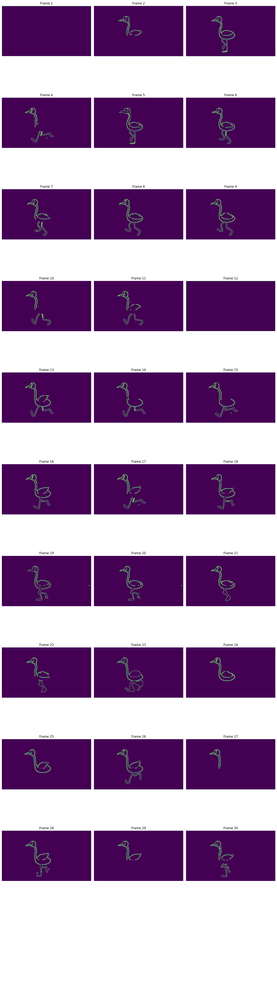

In [47]:
# Example usage:
png_directory = '/content/drive/MyDrive/AAAI/contour_frames_for_bird/'
display_pngs_from_folder(png_directory)

In [48]:
# Example usage:
input_dir = '/content/drive/MyDrive/AAAI/contour_frames_for_bird/'
output_file = "/content/drive/MyDrive/AAAI/Purple_bird.gif"

merge_pngs_to_gif(input_dir, output_file)


30


<ipython-input-21-b52d4ab4fa5f>:20: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(png_file)


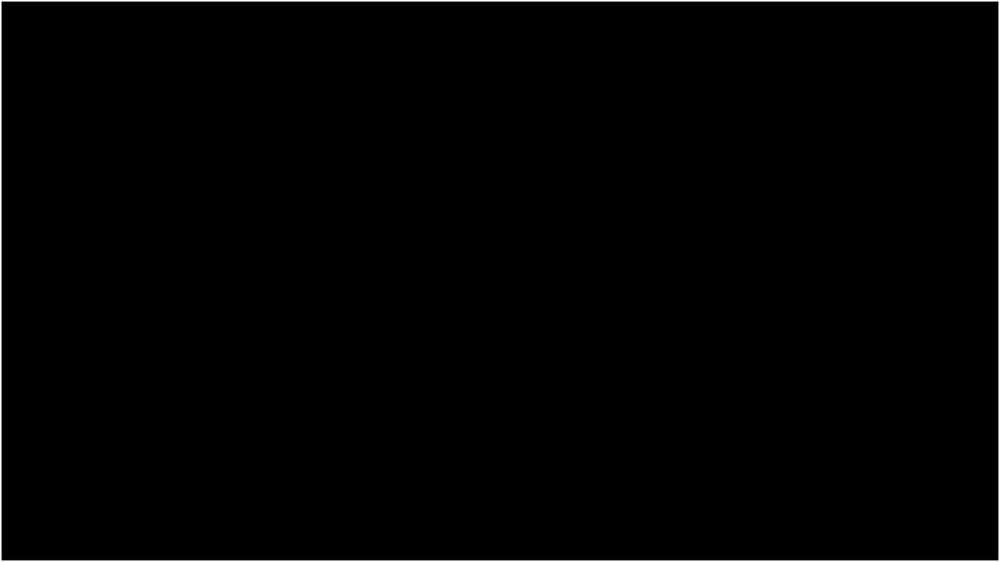

In [49]:
from IPython.display import display, Image

# Path to the GIF in Google Drive
input_gif_path = "/content/drive/MyDrive/AAAI/Purple_bird.gif"

# Display the GIF
with open(input_gif_path, "rb") as f:
    display(Image(data=f.read(), format='png'))

## **Average Outline**

In [42]:
import cv2
import numpy as np
from PIL import Image, ImageSequence
import os

def extract_foreground_using_MOG2(input_gif_path, output_folder):
    # Check and create output directory if it doesn't exist
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    # Load the GIF
    img = Image.open(input_gif_path)
    frames = [frame.copy() for frame in ImageSequence.Iterator(img)]

    # Initialize the MOG2 background subtractor
    fgbg = cv2.createBackgroundSubtractorMOG2()

    # Process all frames in the GIF
    all_masks = []
    for frame in frames:
        frame_np = np.array(frame)
        if frame_np.shape[-1] == 4:
            frame_np = cv2.cvtColor(frame_np, cv2.COLOR_RGBA2RGB)
        fgmask = fgbg.apply(frame_np)
        all_masks.append(fgmask)

    # Kernel for dilation
    kernel = np.ones((3,3), np.uint8)

    # Extract contours of the foreground objects for all frames
    accumulated_outline = np.zeros_like(all_masks[0], dtype=np.float32)

    for idx, mask in enumerate(all_masks):
        dilated = cv2.dilate(mask, kernel, iterations=2)
        contours, _ = cv2.findContours(dilated, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        contour_image = np.zeros_like(mask, dtype=np.float32)
        cv2.drawContours(contour_image, contours, -1, 1, 2)  # Notice we use 1 instead of 255
        accumulated_outline += contour_image

    # Create average outline
    avg_threshold = 0.5 * len(all_masks)  # This can be adjusted
    _, average_outline = cv2.threshold(accumulated_outline, avg_threshold, 255, cv2.THRESH_BINARY)

    # Save the average outline
    avg_outline_path = os.path.join(output_folder, "average_outline.png")
    cv2.imwrite(avg_outline_path, average_outline)

    print(f"Average outline saved in: {avg_outline_path}")

# Example usage:
input_gif_path = "/content/drive/MyDrive/AAAI/bird.gif"
output_folder = "/content/drive/MyDrive/AAAI/average_frames"
extract_foreground_using_MOG2(input_gif_path, output_folder)


Average outline saved in: /content/drive/MyDrive/AAAI/average_frames/average_outline.png


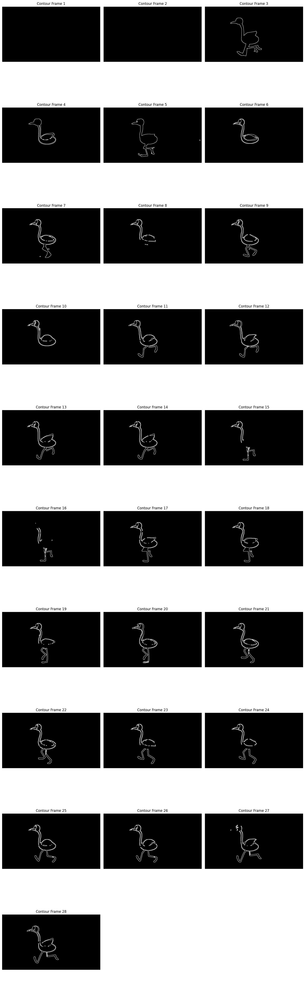

In [ ]:
import cv2
import numpy as np
from PIL import Image, ImageSequence
import matplotlib.pyplot as plt

# Path to the GIF in Google Drive
input_gif_path = "/content/drive/MyDrive/AAAI/extendedbird.gif"

# Load the GIF
img = Image.open(input_gif_path)
frames = [frame.copy() for frame in ImageSequence.Iterator(img)]

# Initialize the MOG2 background subtractor
fgbg = cv2.createBackgroundSubtractorMOG2()

# Process all frames in the GIF
all_foreground_frames = []

for frame in frames:
    # Convert PIL frame to numpy array
    frame_np = np.array(frame)

    # Convert RGBA to RGB (if needed)
    if frame_np.shape[-1] == 4:
        frame_np = cv2.cvtColor(frame_np, cv2.COLOR_RGBA2RGB)

    fgmask = fgbg.apply(frame_np)

    # Apply the mask to get the foreground
    foreground = cv2.bitwise_and(frame_np, frame_np, mask=fgmask)

    all_foreground_frames.append(foreground)

# Extract contours of the foreground objects for all frames
kernel = np.ones((3,3), np.uint8)  # Kernel for dilation
all_contour_frames = []

for frame in all_foreground_frames:
    # If the frame is already grayscale, skip the conversion
    if len(frame.shape) == 2 or frame.shape[2] == 1:
        gray_frame = frame
    else:
        # Convert RGB frame to grayscale
        gray_frame = cv2.cvtColor(frame, cv2.COLOR_RGB2GRAY)

    # Apply binary thresholding
    _, thresh = cv2.threshold(gray_frame, 1, 255, cv2.THRESH_BINARY)

    # Dilation to enhance the thickness of the contours
    dilated = cv2.dilate(thresh, kernel, iterations=2)

    # Find contours on the dilated image
    contours, _ = cv2.findContours(dilated, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Create an empty black image to draw contours on
    contour_image = np.zeros_like(gray_frame)

    # Draw contours with increased thickness
    cv2.drawContours(contour_image, contours, -1, 255, 2)  # Drawing in white color with thickness=2

    # Draw a rectangle around the entire image
    h, w = contour_image.shape
    cv2.rectangle(contour_image, (0, 0), (w-1, h-1), 255, 1)

    all_contour_frames.append(contour_image)

# Display all the contour frames
num_frames = len(all_contour_frames)
rows = (num_frames // 3) + int(num_frames % 3 > 0)
fig, ax = plt.subplots(rows, 3, figsize=(15, 5 * rows))

for i, contour_frame in enumerate(all_contour_frames):
    row = i // 3
    col = i % 3
    ax[row, col].imshow(contour_frame, cmap='gray')
    ax[row, col].axis('off')
    ax[row, col].set_title(f"Contour Frame {i + 1}")

# Turn off axes for any unused subplots
for i in range(num_frames, rows * 3):
    row = i // 3
    col = i % 3
    ax[row, col].axis('off')

plt.tight_layout()
plt.show()



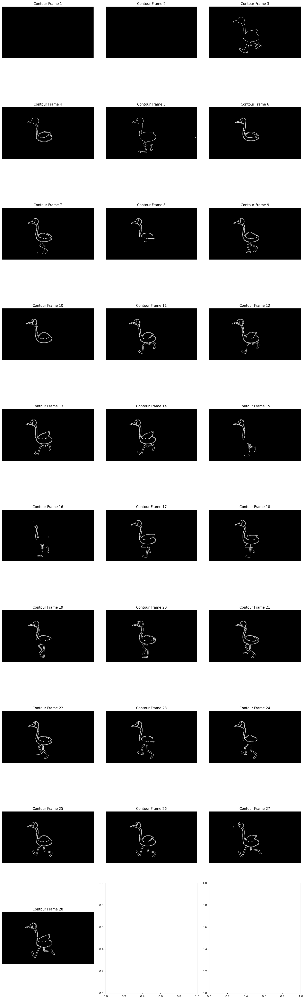

In [ ]:
import cv2
import numpy as np
from PIL import Image, ImageSequence
import matplotlib.pyplot as plt

# Path to the GIF
input_gif_path = "/content/drive/MyDrive/AAAI/bird.gif"

# Load the GIF
img = Image.open(input_gif_path)
frames = [frame.copy() for frame in ImageSequence.Iterator(img)]

# Append the first two frames at the beginning and the last two frames at the end multiple times (say 5 times for now)
frames = frames[:2] * 5 + frames + frames[-2:] * 5

# Convert frames to numpy arrays
frames_np = [np.array(frame) for frame in frames]

# Initialize the MOG2 background subtractor
fgbg = cv2.createBackgroundSubtractorMOG2()

# Process all frames in the GIF
all_foreground_frames = []

for frame in frames_np:
    # Convert RGBA to RGB (if needed)
    if frame.shape[-1] == 4:
        frame = cv2.cvtColor(frame, cv2.COLOR_RGBA2RGB)

    fgmask = fgbg.apply(frame)
    foreground = cv2.bitwise_and(frame, frame, mask=fgmask)
    all_foreground_frames.append(foreground)

# Extract contours of the foreground objects for all frames
kernel = np.ones((3,3), np.uint8)
all_contour_frames = []

for frame in all_foreground_frames:
    if len(frame.shape) == 2:
        gray_frame = frame
    else:
        gray_frame = cv2.cvtColor(frame, cv2.COLOR_RGB2GRAY)

    _, thresh = cv2.threshold(gray_frame, 1, 255, cv2.THRESH_BINARY)
    dilated = cv2.dilate(thresh, kernel, iterations=2)
    contours, _ = cv2.findContours(dilated, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contour_image = np.zeros_like(gray_frame)
    cv2.drawContours(contour_image, contours, -1, 255, 2)
    all_contour_frames.append(contour_image)

# Remove the additional frames used for initialization from the beginning and the end
all_contour_frames = all_contour_frames[len(frames[:2]*5):-len(frames[-2:]*5)]

# Display the contour frames
num_frames = len(all_contour_frames)
rows = (num_frames // 3) + int(num_frames % 3 > 0)
fig, ax = plt.subplots(rows, 3, figsize=(15, 5 * rows))

for i, contour_frame in enumerate(all_contour_frames):
    row = i // 3
    col = i % 3
    ax[row, col].imshow(contour_frame, cmap='gray')
    ax[row, col].axis('off')
    ax[row, col].set_title(f"Contour Frame {i + 1}")

plt.tight_layout()
plt.show()



**ViBe (Visual Background Extractor) is a lightweight and efficient background subtractor that is well-suited for real-time applications. It works by modeling the background as a set of pixels that are consistently present over time.**

In [ ]:
!pip install vibe-background-removal


ERROR: Could not find a version that satisfies the requirement vibe-background-removal (from versions: none)
ERROR: No matching distribution found for vibe-background-removal


In [ ]:
import cv2
import numpy as np
from PIL import Image, ImageSequence
from vibe import VIBE

# Load your GIF
input_gif_path = "/path_to_your_gif/bird.gif"
img = Image.open(input_gif_path)
frames = [frame.copy() for frame in ImageSequence.Iterator(img)]

# Initialize ViBe
vibe = VIBE(num_samples=20, pixel_neighbor=1, distance_threshold=20, matching_threshold=3, update_factor=16)

all_foreground_frames = []

# Process all frames in the GIF
for frame in frames:
    frame_np = np.array(frame)
    if frame_np.shape[-1] == 4:
        frame_np = cv2.cvtColor(frame_np, cv2.COLOR_RGBA2RGB)

    # Apply ViBe
    mask = vibe.apply(frame_np)
    foreground = cv2.bitwise_and(frame_np, frame_np, mask=cv2.bitwise_not(mask))  # Extract the foreground
    all_foreground_frames.append(foreground)

# At this point, `all_foreground_frames` contains the foreground frames after background subtraction.
# You can display them, save them, or further process them as needed.


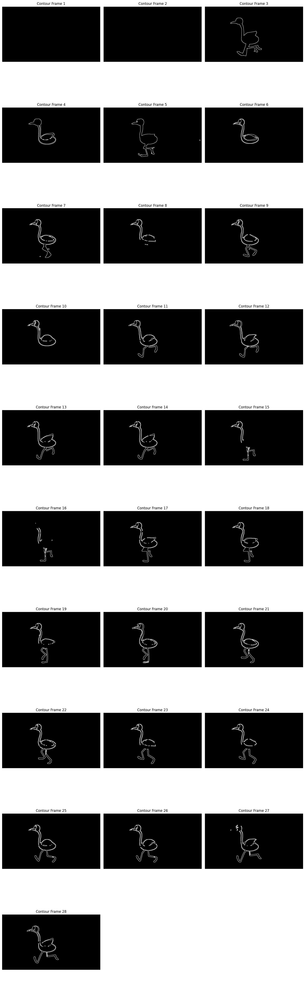

In [ ]:
import cv2
import numpy as np
from PIL import Image, ImageSequence
import matplotlib.pyplot as plt

# Path to the GIF in Google Drive
input_gif_path = "/content/drive/MyDrive/AAAI/bird.gif"

# Load the GIF
img = Image.open(input_gif_path)
frames = [frame.copy() for frame in ImageSequence.Iterator(img)]

# Initialize the MOG2 background subtractor
fgbg = cv2.createBackgroundSubtractorMOG2()

# Process all frames in the GIF
all_foreground_frames = []

for frame in frames:
    # Convert PIL frame to numpy array
    frame_np = np.array(frame)

    # Convert RGBA to RGB (if needed)
    if frame_np.shape[-1] == 4:
        frame_np = cv2.cvtColor(frame_np, cv2.COLOR_RGBA2RGB)

    fgmask = fgbg.apply(frame_np)

    # Apply the mask to get the foreground
    foreground = cv2.bitwise_and(frame_np, frame_np, mask=fgmask)

    all_foreground_frames.append(foreground)

# Extract contours of the foreground objects for all frames
kernel = np.ones((3,3), np.uint8)  # Kernel for dilation
all_contour_frames = []

for frame in all_foreground_frames:
    # If the frame is already grayscale, skip the conversion
    if len(frame.shape) == 2 or frame.shape[2] == 1:
        gray_frame = frame
    else:
        # Convert RGB frame to grayscale
        gray_frame = cv2.cvtColor(frame, cv2.COLOR_RGB2GRAY)

    # Apply binary thresholding
    _, thresh = cv2.threshold(gray_frame, 1, 255, cv2.THRESH_BINARY)

    # Dilation to enhance the thickness of the contours
    dilated = cv2.dilate(thresh, kernel, iterations=2)

    # Find contours on the dilated image
    contours, _ = cv2.findContours(dilated, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Create an empty black image to draw contours on
    contour_image = np.zeros_like(gray_frame)

    # Draw contours with increased thickness
    cv2.drawContours(contour_image, contours, -1, 255, 2)  # Drawing in white color with thickness=2

    # Draw a rectangle around the entire image
    h, w = contour_image.shape
    cv2.rectangle(contour_image, (0, 0), (w-1, h-1), 255, 1)

    all_contour_frames.append(contour_image)

# Display all the contour frames
num_frames = len(all_contour_frames)
rows = (num_frames // 3) + int(num_frames % 3 > 0)
fig, ax = plt.subplots(rows, 3, figsize=(15, 5 * rows))

for i, contour_frame in enumerate(all_contour_frames):
    row = i // 3
    col = i % 3
    ax[row, col].imshow(contour_frame, cmap='gray')
    ax[row, col].axis('off')
    ax[row, col].set_title(f"Contour Frame {i + 1}")

# Turn off axes for any unused subplots
for i in range(num_frames, rows * 3):
    row = i // 3
    col = i % 3
    ax[row, col].axis('off')

plt.tight_layout()
plt.show()



# **Noise Renoval**

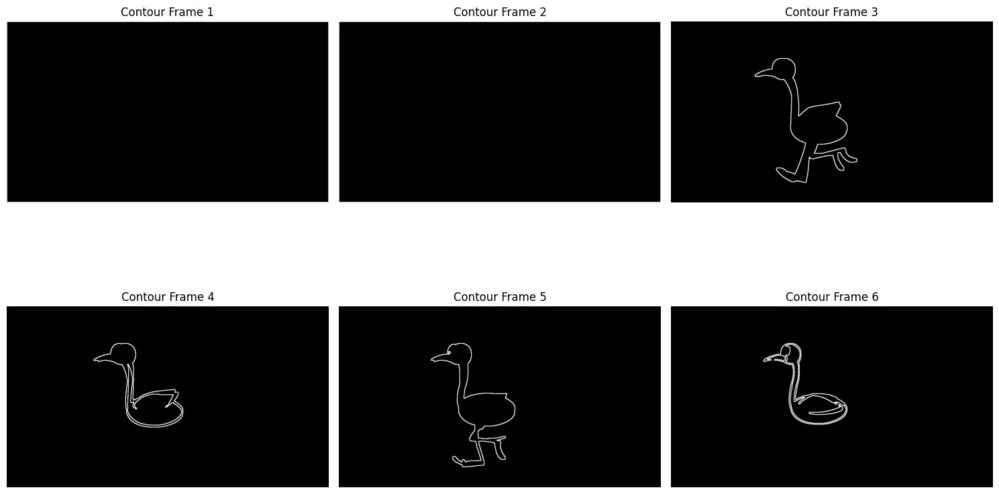

In [ ]:
import cv2
import numpy as np
from PIL import Image, ImageSequence
import matplotlib.pyplot as plt

# Load the GIF
input_gif_path = "/content/drive/MyDrive/AAAI/bird.gif"

# Load the GIF
img = Image.open(input_gif_path)
frames = [frame.copy() for frame in ImageSequence.Iterator(img)]

# Initialize the MOG2 background subtractor
fgbg = cv2.createBackgroundSubtractorMOG2()

# Process all frames in the GIF
all_foreground_frames = []
for frame in frames:
    frame_np = np.array(frame)
    if frame_np.shape[-1] == 4:
        frame_np = cv2.cvtColor(frame_np, cv2.COLOR_RGBA2RGB)
    fgmask = fgbg.apply(frame_np)
    foreground = cv2.bitwise_and(frame_np, frame_np, mask=fgmask)
    all_foreground_frames.append(foreground)

# Kernel for dilation
kernel = np.ones((3,3), np.uint8)

# Extract and refine contours of the foreground objects for all frames
radius_threshold = 50
filtered_contour_frames = []
for frame in all_foreground_frames:
    if frame.shape[-1] == 3:
        gray_frame = cv2.cvtColor(frame, cv2.COLOR_RGB2GRAY)
    else:
        gray_frame = frame
    _, thresh = cv2.threshold(gray_frame, 1, 255, cv2.THRESH_BINARY)
    dilated = cv2.dilate(thresh, kernel, iterations=2)
    contours, _ = cv2.findContours(dilated, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contour_image = np.zeros_like(gray_frame)
    for contour in contours:
        M = cv2.moments(contour)
        if M["m00"] == 0:
            continue
        cX = int(M["m10"] / M["m00"])
        cY = int(M["m01"] / M["m00"])
        centroid = np.array([cX, cY])
        distances = np.linalg.norm(contour - centroid, axis=2)
        if np.all(distances < radius_threshold):
            continue
        cv2.drawContours(contour_image, [contour], -1, 255, 2)
    filtered_contour_frames.append(contour_image)

# Display the first 6 filtered contour frames in a 2x3 grid
fig, ax = plt.subplots(2, 3, figsize=(15, 10))
for i, contour_frame in enumerate(filtered_contour_frames[:6]):
    row = i // 3
    col = i % 3
    ax[row, col].imshow(contour_frame, cmap='gray')
    ax[row, col].axis('off')
    ax[row, col].set_title(f"Contour Frame {i + 1}")
plt.tight_layout()
plt.show()

In [ ]:
from PIL import Image

# Convert the processed frames back to PIL images
filtered_pil_frames = [Image.fromarray(frame) for frame in filtered_contour_frames]
print(len(filtered_pil_frames))
# Save as a new GIF
output_gif_path = "/content/drive/MyDrive/AAAI/bird_no_noise.gif"  # Change this to your desired output path
#filtered_pil_frames[0].save(output_gif_path, save_all=True, append_images=filtered_pil_frames[1:], loop=0, duration=img.info['duration'])

print(f"New GIF saved at: {output_gif_path}")


28
New GIF saved at: /content/drive/MyDrive/AAAI/bird_no_noise.gif


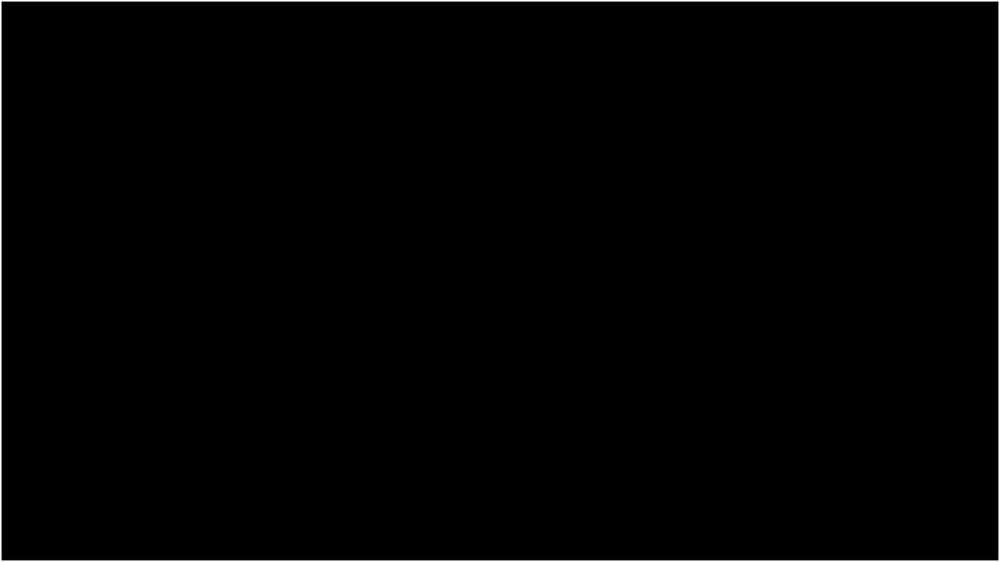

In [ ]:
from IPython.display import display, Image

# Path to the GIF in Google Drive
input_gif_path = "/content/drive/MyDrive/AAAI/bird_no_noise.gif"

# Display the GIF
with open(input_gif_path, "rb") as f:
    display(Image(data=f.read(), format='png'))

## **Purple outline**

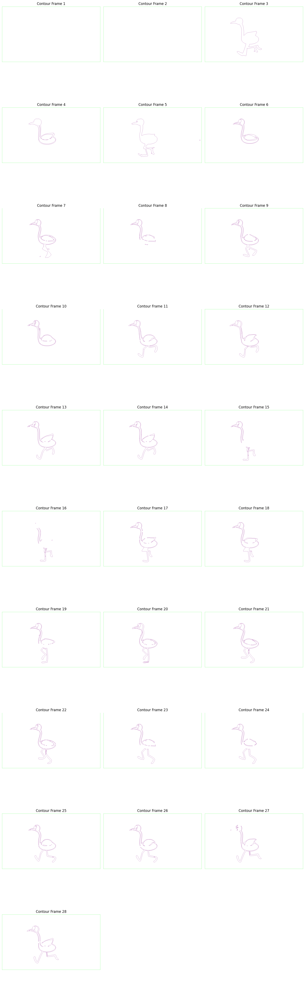

In [ ]:
import cv2
import numpy as np
from PIL import Image, ImageSequence
import matplotlib.pyplot as plt

# Path to the GIF in Google Drive
input_gif_path = "/content/drive/MyDrive/AAAI/bird.gif"

# Load the GIF
img = Image.open(input_gif_path)
frames = [frame.copy() for frame in ImageSequence.Iterator(img)]

# Initialize the MOG2 background subtractor
fgbg = cv2.createBackgroundSubtractorMOG2()

# Process all frames in the GIF
all_foreground_frames = []

for frame in frames:
    # Convert PIL frame to numpy array
    frame_np = np.array(frame)

    # Convert RGBA to RGB (if needed)
    if frame_np.shape[-1] == 4:
        frame_np = cv2.cvtColor(frame_np, cv2.COLOR_RGBA2RGB)

    fgmask = fgbg.apply(frame_np)

    # Apply the mask to get the foreground
    foreground = cv2.bitwise_and(frame_np, frame_np, mask=fgmask)

    all_foreground_frames.append(foreground)

# Extract contours of the foreground objects for all frames
kernel = np.ones((3,3), np.uint8)  # Kernel for dilation
all_contour_frames = []

for frame in all_foreground_frames:
    # Convert RGB frame to grayscale, if not already grayscale
    if len(frame.shape) == 2 or frame.shape[2] == 1:
        gray_frame = frame
    else:
        gray_frame = cv2.cvtColor(frame, cv2.COLOR_RGB2GRAY)

    # Apply binary thresholding
    _, thresh = cv2.threshold(gray_frame, 1, 255, cv2.THRESH_BINARY)

    # Dilation to enhance the thickness of the contours
    dilated = cv2.dilate(thresh, kernel, iterations=2)

    # Find contours on the dilated image
    contours, _ = cv2.findContours(dilated, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Create an empty white image to draw contours on
    contour_image = 255 * np.ones_like(frame)

    # If the contour image is grayscale, convert it to RGB
    if len(contour_image.shape) == 2:
        contour_image = cv2.cvtColor(contour_image, cv2.COLOR_GRAY2RGB)

    # Draw contours with increased thickness in green color
    #cv2.drawContours(contour_image, contours, -1, [0, 255, 0], 2)  # Green color with thickness=2
    # Draw contours with increased thickness in purple color
    cv2.drawContours(contour_image, contours, -1, [128, 0, 128], 1)  # Purple color with thickness=1


    # Draw a green rectangle around the entire image
    h, w, _ = contour_image.shape
    cv2.rectangle(contour_image, (0, 0), (w-1, h-1), [0, 255, 0], 1)

    all_contour_frames.append(contour_image)

# Display all the contour frames
num_frames = len(all_contour_frames)
rows = (num_frames // 3) + int(num_frames % 3 > 0)
fig, ax = plt.subplots(rows, 3, figsize=(15, 5 * rows))

for i, contour_frame in enumerate(all_contour_frames):
    row = i // 3
    col = i % 3
    ax[row, col].imshow(contour_frame)
    ax[row, col].axis('off')
    ax[row, col].set_title(f"Contour Frame {i + 1}")

# Turn off axes for any unused subplots
for i in range(num_frames, rows * 3):
    row = i // 3
    col = i % 3
    ax[row, col].axis('off')

plt.tight_layout()
plt.show()


## **Save the Frames**

In [ ]:
# Define the output directory
output_directory = "/content/drive/MyDrive/AAAI/contour_frames_purple_bird"

# Create the directory if it doesn't exist
os.makedirs(output_directory, exist_ok=True)

# Save each contour frame
for idx, contour_frame in enumerate(all_contour_frames):
    filename = f"contour_frame_{idx + 1}.png"
    filepath = os.path.join(output_directory, filename)

    # UNCOMMENT TO REWRITE
    cv2.imwrite(filepath, contour_frame)

print(f"Saved {len(all_contour_frames)} contour frames to {output_directory}")


Saved 28 contour frames to /content/drive/MyDrive/AAAI/contour_frames_purple_bird


# ***Add Grids***

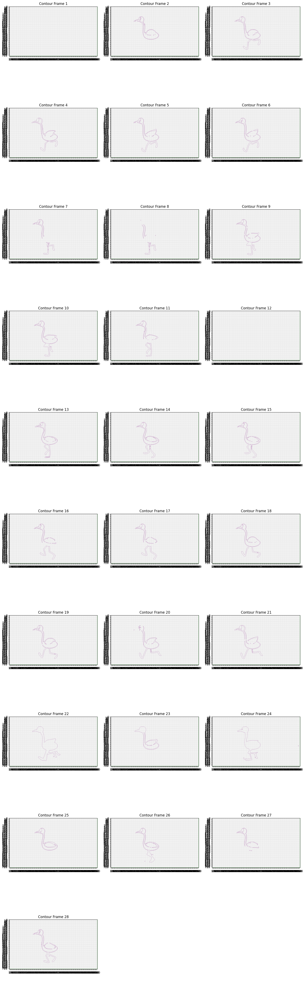

In [ ]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt

# Define the path to the previously saved contour frames
contour_frames_folder = "/content/drive/MyDrive/AAAI/contour_frames_purple_bird"

# Load the saved contour frames
saved_contour_frames = []
frame_files = sorted(os.listdir(contour_frames_folder))
for frame_file in frame_files:
    frame_path = os.path.join(contour_frames_folder, frame_file)
    frame = cv2.imread(frame_path)
    if frame is not None:
        saved_contour_frames.append(frame)

# Display the frames with the axes
num_frames = len(saved_contour_frames)
rows = (num_frames // 3) + int(num_frames % 3 > 0)

fig, ax = plt.subplots(rows, 3, figsize=(15, 5 * rows))

for i, overlay_frame in enumerate(saved_contour_frames):
    row = i // 3
    col = i % 3
    ax[row, col].imshow(cv2.cvtColor(overlay_frame, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for displaying
    ax[row, col].set_xticks(np.arange(0, overlay_frame.shape[1], 10))
    ax[row, col].set_yticks(np.arange(0, overlay_frame.shape[0], 10))
    ax[row, col].grid(which='both', alpha=0.3)
    ax[row, col].set_title(f"Contour Frame {i + 1}")

# Turn off axes for any unused subplots
for i in range(num_frames, rows * 3):
    row = i // 3
    col = i % 3
    ax[row, col].axis('off')

plt.tight_layout()
plt.show()



In [ ]:
import cv2
import numpy as np
import os

# Define the path to the previously saved contour frames
contour_frames_folder = "/content/drive/MyDrive/AAAI/contour_frames_purple_bird"

# Directory for saving the coordinate files
coords_folder = "/content/drive/MyDrive/AAAI/coords_bird"
os.makedirs(coords_folder, exist_ok=True)

# List all the frame files
frame_files = sorted(os.listdir(contour_frames_folder))

for idx, frame_file in enumerate(frame_files):
    #print("in a loop")
    # Load the frame
    frame_path = os.path.join(contour_frames_folder, frame_file)
    frame = cv2.imread(frame_path)

    coords = []

    # Convert frame to HSV for better color segmentation
    hsv = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)

    # Define a range for purple color
    lower_purple = np.array([130, 50, 50])
    upper_purple = np.array([160, 255, 255])

    # Create a mask for purple color
    mask = cv2.inRange(hsv, lower_purple, upper_purple)

    y_indices, x_indices = np.where(mask == 255)
    coords = list(zip(x_indices, y_indices))

    # Define the path for the coordinates file
    coords_path = os.path.join(coords_folder, f"frame_{idx + 1}_coords.txt")

    # Save the coordinates to a separate txt file for the frame
    if coords:
        with open(coords_path, 'w') as f:
            for coord in coords:
                f.write(f"{coord}\n")

    print(f"Saved coordinates for frame {idx + 1} to {coords_path}")


in a loop
Saved coordinates for frame 1 to /content/drive/MyDrive/AAAI/coords_bird/frame_1_coords.txt
in a loop
Saved coordinates for frame 2 to /content/drive/MyDrive/AAAI/coords_bird/frame_2_coords.txt
in a loop
Saved coordinates for frame 3 to /content/drive/MyDrive/AAAI/coords_bird/frame_3_coords.txt
in a loop
Saved coordinates for frame 4 to /content/drive/MyDrive/AAAI/coords_bird/frame_4_coords.txt
in a loop
Saved coordinates for frame 5 to /content/drive/MyDrive/AAAI/coords_bird/frame_5_coords.txt
in a loop
Saved coordinates for frame 6 to /content/drive/MyDrive/AAAI/coords_bird/frame_6_coords.txt
in a loop
Saved coordinates for frame 7 to /content/drive/MyDrive/AAAI/coords_bird/frame_7_coords.txt
in a loop
Saved coordinates for frame 8 to /content/drive/MyDrive/AAAI/coords_bird/frame_8_coords.txt
in a loop
Saved coordinates for frame 9 to /content/drive/MyDrive/AAAI/coords_bird/frame_9_coords.txt
in a loop
Saved coordinates for frame 10 to /content/drive/MyDrive/AAAI/coords_bir

# **Skeleton Draft **

In [ ]:
import os
import cv2
from collections import defaultdict
import numpy as np

# Directories
coord_directory = "/content/drive/MyDrive/AAAI/coords_bird"
contour_frames_folder =  "/content/drive/MyDrive/AAAI/contour_frames_purple_bird"
output_directory = "/content/drive/MyDrive/AAAI/bird_skeleton"
os.makedirs(output_directory, exist_ok=True)

# List all the .txt files in the coord directory
txt_files = [f for f in sorted(os.listdir(coord_directory)) if f.endswith(".txt")]

for idx, txt_file in enumerate(txt_files):
    # Read the .txt file and convert to list of coordinates
    with open(os.path.join(coord_directory, txt_file), 'r') as file:
        coords = [tuple(map(int, line.strip().replace('(', '').replace(')', '').split(','))) for line in file.readlines()]

    # Create dictionaries to store x and y coordinates
    y_to_xs = defaultdict(list)
    x_to_ys = defaultdict(list)
    for x, y in coords:
        y_to_xs[y].append(x)
        x_to_ys[x].append(y)

    # Load the corresponding purple contour frame
    frame_path = os.path.join(contour_frames_folder, f"contour_frame_{idx + 1}.png")
    frame = cv2.imread(frame_path)

    # Draw midpoints for y_to_xs
    for y, xs in y_to_xs.items():
        if len(xs) >= 2:
            x_mid = (min(xs) + max(xs)) // 2
            cv2.circle(frame, (x_mid, y), 2, (0, 0, 255), -1)  # Red dot

    # Draw midpoints for x_to_ys
    for x, ys in x_to_ys.items():
        if len(ys) >= 2:
            y_mid = (min(ys) + max(ys)) // 2
            cv2.circle(frame, (x, y_mid), 2, (0, 0, 255), -1)  # Red dot

    # Save the modified frame
    output_path = os.path.join(output_directory, f"output_frame_{idx + 1}.png")
    cv2.imwrite(output_path, frame)

    print(f"Saved frame {idx + 1} with midpoints to {output_path}")




Saved frame 1 with midpoints to /content/drive/MyDrive/AAAI/bird_skeleton/output_frame_1.png
Saved frame 2 with midpoints to /content/drive/MyDrive/AAAI/bird_skeleton/output_frame_2.png
Saved frame 3 with midpoints to /content/drive/MyDrive/AAAI/bird_skeleton/output_frame_3.png
Saved frame 4 with midpoints to /content/drive/MyDrive/AAAI/bird_skeleton/output_frame_4.png
Saved frame 5 with midpoints to /content/drive/MyDrive/AAAI/bird_skeleton/output_frame_5.png
Saved frame 6 with midpoints to /content/drive/MyDrive/AAAI/bird_skeleton/output_frame_6.png
Saved frame 7 with midpoints to /content/drive/MyDrive/AAAI/bird_skeleton/output_frame_7.png
Saved frame 8 with midpoints to /content/drive/MyDrive/AAAI/bird_skeleton/output_frame_8.png
Saved frame 9 with midpoints to /content/drive/MyDrive/AAAI/bird_skeleton/output_frame_9.png
Saved frame 10 with midpoints to /content/drive/MyDrive/AAAI/bird_skeleton/output_frame_10.png
Saved frame 11 with midpoints to /content/drive/MyDrive/AAAI/bird_sk

## **Show Skeleton**

In [ ]:
from PIL import Image
import os

# Directories
output_directory = "/content/drive/MyDrive/AAAI/bird_skeleton"
output_gif_path = "/content/drive/MyDrive/AAAI/bird_skeleton.gif"

# Load the modified frames
frames = [Image.open(os.path.join(output_directory, f"output_frame_{idx + 1}.png")) for idx in range(len(txt_files))]

# Save the frames as a GIF
frames[0].save(output_gif_path, save_all=True, append_images=frames[1:], loop=0, duration=100)

print(f"Saved GIF to {output_gif_path}")


Saved GIF to /content/drive/MyDrive/AAAI/bird_skeleton.gif


## **Show Skeleton**

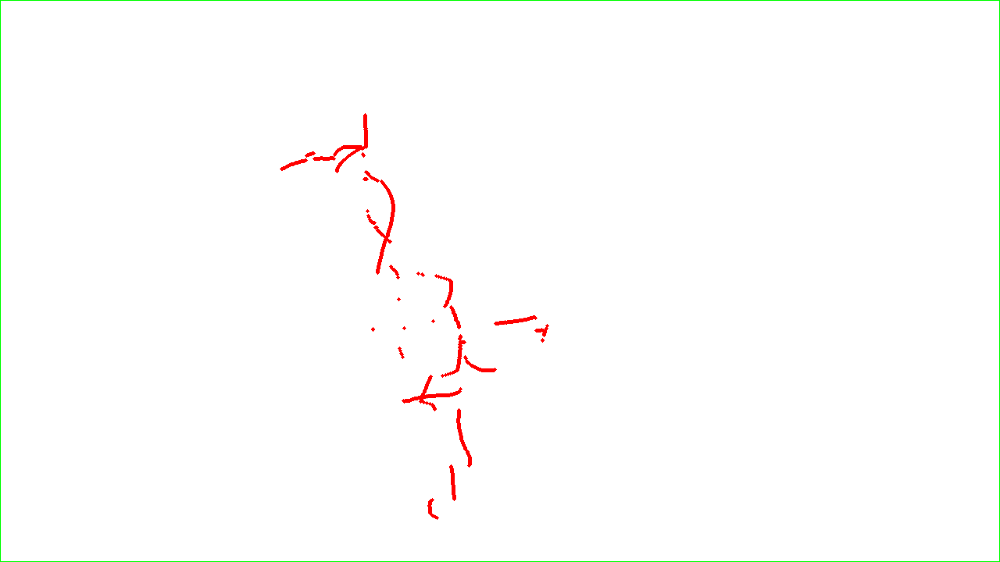

In [ ]:
from IPython.display import display, Image

# Path to the GIF in Google Drive
input_gif_path = "/content/drive/MyDrive/AAAI/bird_skeleton.gif"

# Display the GIF
with open(input_gif_path, "rb") as f:
    display(Image(data=f.read(), format='png'))


# **Split Original in KMeans = 4 colors: Segmentation**

In [ ]:
import cv2
import numpy as np
from PIL import Image, ImageSequence
from sklearn.cluster import KMeans

# Load the GIF
input_gif_path = "/content/drive/MyDrive/AAAI/bird.gif"
img = Image.open(input_gif_path)
frames = [frame.copy() for frame in ImageSequence.Iterator(img)]

def segment_image_colors(image, n_colors=4):
    # Convert to RGB
    image = cv2.cvtColor(image, cv2.COLOR_RGBA2RGB)
    # Reshape the image to be a list of pixels
    pixels = image.reshape(-1, 3)
    # Apply k-means clustering with explicit n_init
    kmeans = KMeans(n_clusters=n_colors, n_init=10).fit(pixels)
    segmented_img = kmeans.cluster_centers_[kmeans.labels_]
    # Reshape back to the original image
    segmented_img = segmented_img.reshape(image.shape).astype(np.uint8)
    return segmented_img


# Segment each frame
segmented_frames = [segment_image_colors(np.array(frame)) for frame in frames]

# Convert frames back to PIL for GIF creation
segmented_frames_pil = [Image.fromarray(frame) for frame in segmented_frames]

# Ensure all frames have the same size and mode (RGBA)
base_size = segmented_frames_pil[0].size
base_mode = segmented_frames_pil[0].mode
segmented_frames_pil_resized = [frame.convert(base_mode).resize(base_size) for frame in segmented_frames_pil]

# Save as a new GIF
output_gif_path = "/content/drive/MyDrive/AAAI/segmented_bird.gif"
segmented_frames_pil_resized[0].save(output_gif_path, save_all=True, append_images=segmented_frames_pil_resized[1:], loop=0, duration=frames[0].info['duration'])


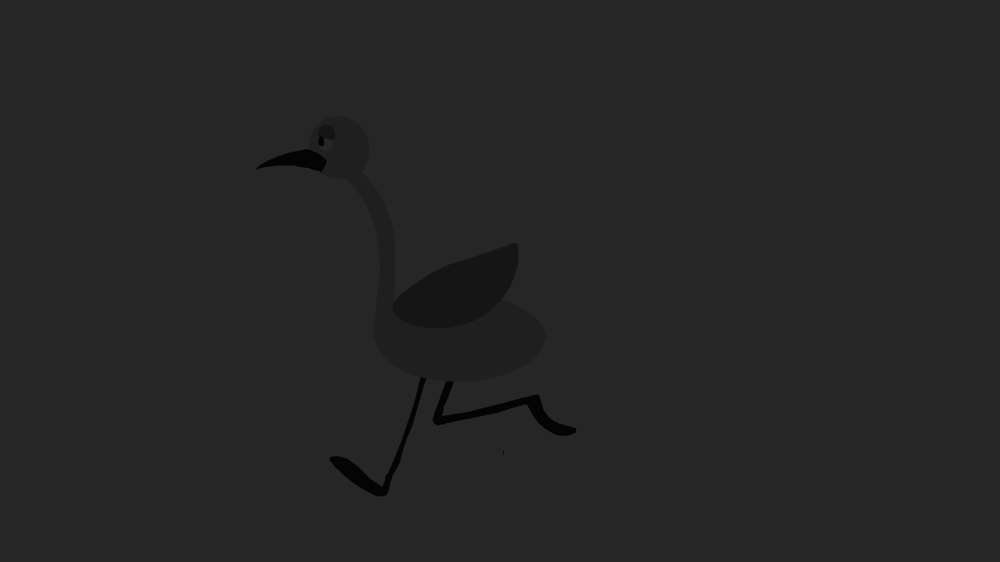

In [ ]:
from IPython.display import display, Image

# Path to the GIF in Google Drive
input_gif_path = "/content/drive/MyDrive/AAAI/segmented_bird.gif"

# Display the GIF
with open(input_gif_path, "rb") as f:
    display(Image(data=f.read(), format='png'))

In [ ]:
import imageio
from sklearn.cluster import KMeans
from skimage.transform import resize
import numpy as np

# Load the GIF using ImageIO's get_reader
gif_path = "/content/drive/MyDrive/AAAI/bird.gif"
reader = imageio.get_reader(gif_path)

# Extract the duration of the GIF frames and the frames themselves
durations = []
frames = []
for i, frame in enumerate(reader):
    durations.append(reader.get_meta_data(i)['duration'])
    frames.append(np.array(frame))

# Segment the frames
segmented_frames = []
for img in frames:
    # Convert the image into a list of pixels
    pixels = img.reshape(-1, 4)

    # Cluster the pixels using KMeans
    kmeans = KMeans(n_clusters=2, n_init=10, random_state=0)
    kmeans.fit(pixels)

    # Replace each pixel with its center
    segmented_pixels = np.array([list(kmeans.cluster_centers_[label]) for label in kmeans.labels_])

    # Reshape the result pixels into the original image shape
    segmented_img = segmented_pixels.reshape(img.shape)
    segmented_frames.append(segmented_img.astype(np.uint8))

# Get the shape of the first frame
first_frame_shape = segmented_frames[0].shape

# Resize all frames to match the shape of the first frame
segmented_frames_resized = [resize(frame, first_frame_shape) for frame in segmented_frames]

# Convert values to uint8 format for saving as GIF
segmented_frames_resized = [(frame * 255).astype(np.uint8) for frame in segmented_frames_resized]

# Save the resized frames as a new GIF
output_gif_path = "/content/drive/MyDrive/AAAI/segmented_bird2.gif"
imageio.mimsave(output_gif_path, segmented_frames_resized, duration=durations)



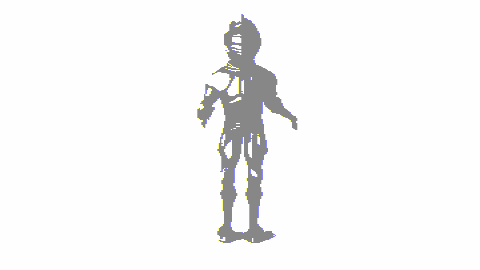

In [ ]:
from IPython.display import display, Image

# Path to the GIF in Google Drive
input_gif_path = "/content/drive/MyDrive/AAAI/segmented_bird2.gif"

# Display the GIF
with open(input_gif_path, "rb") as f:
    display(Image(data=f.read(), format='png'))

## **Segmentation Trials #2**

In [ ]:
import imageio
import numpy as np
from sklearn.cluster import KMeans
from skimage.transform import resize

# Function to segment an image based on KMeans clustering
def segment_image(img, n_clusters):
    # Flatten the image
    pixels = img.reshape(-1, 4)

    # Remove alpha if it's 255 everywhere
    if np.all(pixels[:, 3] == 255):
        pixels = pixels[:, :3]

    # Apply KMeans clustering
    kmeans = KMeans(n_clusters=n_clusters, n_init='auto')
    kmeans.fit(pixels)
    segmented_pixels = kmeans.cluster_centers_[kmeans.labels_]

    # Add back the alpha channel if it was removed earlier
    if segmented_pixels.shape[1] != 4:
        alpha_channel = np.full((segmented_pixels.shape[0], 1), 255)
        segmented_pixels = np.concatenate([segmented_pixels, alpha_channel], axis=1)

    # Convert back to the original shape
    segmented_img = segmented_pixels.reshape(img.shape)
    return segmented_img.astype(np.uint8)

# Read the GIF and its metadata
gif_path = "/content/drive/MyDrive/AAAI/bird.gif"
reader = imageio.get_reader(gif_path)
durations = [reader.get_meta_data(i)['duration'] for i in range(reader.get_length())]

# Process each frame
segmented_frames = []
first_frame_shape = np.array(reader.get_data(0)).shape

for img in reader:
    img_array = np.array(img)
    segmented_img = segment_image(img_array, 4)  # Using 4 clusters

    # Resize the segmented image to match the first frame shape
    resized_segmented_img = resize(segmented_img, (first_frame_shape[0], first_frame_shape[1]), preserve_range=True).astype(np.uint8)

    segmented_frames.append(resized_segmented_img)

# Save the segmented frames as a new GIF
output_gif_path = "/content/drive/MyDrive/AAAI/segmented_bird3.gif"
imageio.mimsave(output_gif_path, segmented_frames, duration=durations)



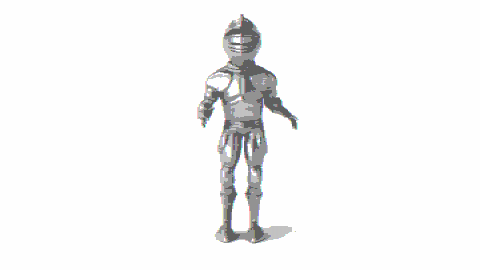

In [ ]:
from IPython.display import display, Image

# Path to the GIF in Google Drive
input_gif_path = "/content/drive/MyDrive/AAAI/segmented_bird3.gif"

# Display the GIF
with open(input_gif_path, "rb") as f:
    display(Image(data=f.read(), format='png'))

## **Show only the shape/outline**

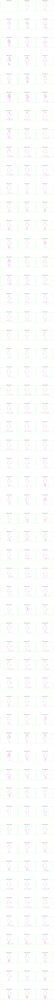

In [ ]:
import cv2
import numpy as np
from PIL import Image, ImageSequence
import matplotlib.pyplot as plt

# Path to the GIF in Google Drive
input_gif_path = "/content/drive/MyDrive/AAAI/warior.gif"

# Load the GIF
img = Image.open(input_gif_path)
frames = [frame.copy() for frame in ImageSequence.Iterator(img)]

# Initialize the MOG2 background subtractor
fgbg = cv2.createBackgroundSubtractorMOG2()

# Process all frames in the GIF
all_foreground_frames = []

for frame in frames:
    # Convert PIL frame to numpy array
    frame_np = np.array(frame)

    # Convert RGBA to RGB (if needed)
    if frame_np.shape[-1] == 4:
        frame_np = cv2.cvtColor(frame_np, cv2.COLOR_RGBA2RGB)

    fgmask = fgbg.apply(frame_np)

    # Apply the mask to get the foreground
    foreground = cv2.bitwise_and(frame_np, frame_np, mask=fgmask)

    all_foreground_frames.append(foreground)

# Extract contours of the foreground objects for all frames
kernel = np.ones((3,3), np.uint8)  # Kernel for dilation
all_contour_frames = []

for frame in all_foreground_frames:
    # Convert RGB frame to grayscale, if not already grayscale
    if len(frame.shape) == 2 or frame.shape[2] == 1:
        gray_frame = frame
    else:
        gray_frame = cv2.cvtColor(frame, cv2.COLOR_RGB2GRAY)

    # Apply binary thresholding
    _, thresh = cv2.threshold(gray_frame, 1, 255, cv2.THRESH_BINARY)

    # Dilation to enhance the thickness of the contours
    dilated = cv2.dilate(thresh, kernel, iterations=2)

    # Find contours on the dilated image
    contours, _ = cv2.findContours(dilated, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Create an empty white image to draw contours on
    contour_image = 255 * np.ones_like(frame)

    # If the contour image is grayscale, convert it to RGB
    if len(contour_image.shape) == 2:
        contour_image = cv2.cvtColor(contour_image, cv2.COLOR_GRAY2RGB)

    # Draw contours with increased thickness in green color
    #cv2.drawContours(contour_image, contours, -1, [0, 255, 0], 2)  # Green color with thickness=2
    # Draw contours with increased thickness in purple color
    cv2.drawContours(contour_image, contours, -1, [128, 0, 128], 1)  # Purple color with thickness=1


    # Draw a green rectangle around the entire image
    h, w, _ = contour_image.shape
    cv2.rectangle(contour_image, (0, 0), (w-1, h-1), [0, 255, 0], 1)

    all_contour_frames.append(contour_image)

# Display all the contour frames
num_frames = len(all_contour_frames)
rows = (num_frames // 3) + int(num_frames % 3 > 0)
fig, ax = plt.subplots(rows, 3, figsize=(15, 5 * rows))

for i, contour_frame in enumerate(all_contour_frames):
    row = i // 3
    col = i % 3
    ax[row, col].imshow(contour_frame)
    ax[row, col].axis('off')
    ax[row, col].set_title(f"Contour Frame {i + 1}")

# Turn off axes for any unused subplots
for i in range(num_frames, rows * 3):
    row = i // 3
    col = i % 3
    ax[row, col].axis('off')

plt.tight_layout()
plt.show()



## **Save the frames** - UNCOMMENT TO SAVE

In [ ]:
# Define the output directory
output_directory = "/content/drive/MyDrive/AAAI/contour_frames_purple"

# Create the directory if it doesn't exist
os.makedirs(output_directory, exist_ok=True)

# Save each contour frame
for idx, contour_frame in enumerate(all_contour_frames):
    filename = f"contour_frame_{idx + 1}.png"
    filepath = os.path.join(output_directory, filename)

    # UNCOMMENT TO REWRITE
    #cv2.imwrite(filepath, contour_frame)

print(f"Saved {len(all_contour_frames)} contour frames to {output_directory}")


Saved 165 contour frames to /content/drive/MyDrive/AAAI/contour_frames_purple


## **Merge Frames into GIF** - UNCOMMENT TO SAVE

In [ ]:
import cv2
import numpy as np
from PIL import Image
from IPython.display import display

# Convert contour frames to PIL images
pil_images = [Image.fromarray(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)) for frame in all_contour_frames]

# Save frames as a GIF
#output_gif_path = "/content/drive/MyDrive/AAAI/green_contours.gif"
output_gif_path = "/content/drive/MyDrive/AAAI/purple_contours.gif"

#UNCOMMENT this to rewrite
#pil_images[0].save(output_gif_path, save_all=True, append_images=pil_images[1:], loop=0, duration=img.info['duration'])


## **Countours GIF**

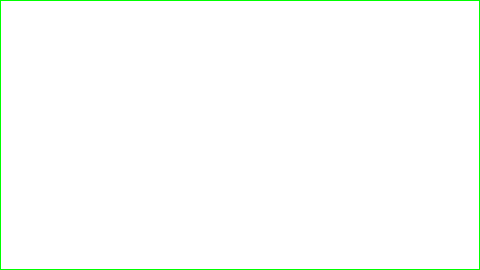

In [ ]:
from IPython.display import display, Image

# Path to the GIF in Google Drive
#path = "/content/drive/MyDrive/AAAI/green_contours.gif"
path = "/content/drive/MyDrive/AAAI/purple_contours.gif"

# Display the GIF
with open(path, "rb") as f:
    display(Image(data=f.read(), format='png'))

# **Add Axis**

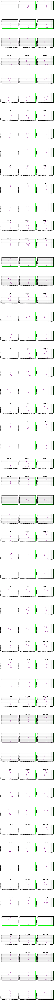

In [ ]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt

# Define the path to the previously saved contour frames
contour_frames_folder = "/content/drive/MyDrive/AAAI/contour_frames_purple"

# Load the saved contour frames
saved_contour_frames = []
frame_files = sorted(os.listdir(contour_frames_folder))
for frame_file in frame_files:
    frame_path = os.path.join(contour_frames_folder, frame_file)
    frame = cv2.imread(frame_path)
    if frame is not None:
        saved_contour_frames.append(frame)

# Display the frames with the axes
num_frames = len(saved_contour_frames)
rows = (num_frames // 3) + int(num_frames % 3 > 0)

fig, ax = plt.subplots(rows, 3, figsize=(15, 5 * rows))

for i, overlay_frame in enumerate(saved_contour_frames):
    row = i // 3
    col = i % 3
    ax[row, col].imshow(cv2.cvtColor(overlay_frame, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for displaying
    ax[row, col].set_xticks(np.arange(0, overlay_frame.shape[1], 10))
    ax[row, col].set_yticks(np.arange(0, overlay_frame.shape[0], 10))
    ax[row, col].grid(which='both', alpha=0.3)
    ax[row, col].set_title(f"Contour Frame {i + 1}")

# Turn off axes for any unused subplots
for i in range(num_frames, rows * 3):
    row = i // 3
    col = i % 3
    ax[row, col].axis('off')

plt.tight_layout()
plt.show()



# **Midpoints array**

In [ ]:
#import cv2
#import numpy as np
##import os
#import matplotlib.pyplot as plt

# Define the path to the previously saved contour frames
#contour_frames_folder = "/content/drive/MyDrive/AAAI/contour_frames_purple"

# Load the saved contour frames
##saved_contour_frames = []
#frame_files = sorted(os.listdir(contour_frames_folder))
#for frame_file in frame_files:
##    frame_path = os.path.join(contour_frames_folder, frame_file)
#    frame = cv2.imread(frame_path)
#    if frame is not None:
#        saved_contour_frames.append(frame)

# Directory for saving the frames with grids
##grid_frames_folder = "/content/drive/MyDrive/AAAI/grid_frames"
#os.makedirs(grid_frames_folder, exist_ok=True)

# Grid interval
#interval = 10
#purple_color = [255, 0, 255]  # BGR format

#all_crossings = []

#for idx, frame in enumerate(saved_contour_frames):
    # Draw grid on the frame
#    for x in range(0, frame.shape[1], interval):
#        cv2.line(frame, (x, 0), (x, frame.shape[0]), (0, 0, 0), 1)
#    for y in range(0, frame.shape[0], interval):
#        cv2.line(frame, (0, y), (frame.shape[1], y), (0, 0, 0), 1)

    # Save the frame with the grid
#    frame_path = os.path.join(grid_frames_folder, f"grid_frame_{idx + 1}.png")
#    cv2.imwrite(frame_path, frame)

    # Detect crossings of purple and grid
#    crossings = []
#    for x in range(0, frame.shape[1], interval):
#        for y in range(0, frame.shape[0], interval):
#            if np.array_equal(frame[y, x], purple_color):
#                crossings.append((x, y))
#    all_crossings.append(crossings)

# Save crossings to a txt file
##crossings_file = "/content/drive/MyDrive/AAAI/crossings.txt"
#with open(crossings_file, 'w') as f:
#    for idx, crossings in enumerate(all_crossings):
#        #f.write(f"Frame {idx + 1}:\n") #UNCOMMENT TO SAVE
#        for crossing in crossings:
#            #f.write(f"{crossing}\n") #UNCOMMENT TO SAVE
#        #UNf.write("\n")
#
#print(f"Saved all crossings to {crossings_file}")

## **Midpoints Array**

In [ ]:
import cv2
import numpy as np
import os

# Define the path to the previously saved contour frames
contour_frames_folder = "/content/drive/MyDrive/AAAI/contour_frames_purple"

# Directory for saving the coordinate files
coords_folder = "/content/drive/MyDrive/AAAI/coords"
os.makedirs(coords_folder, exist_ok=True)

# Define the purple color in BGR format
target_color = np.array([255, 0, 255])
tolerance = 40

# List all the frame files
frame_files = sorted(os.listdir(contour_frames_folder))

for idx, frame_file in enumerate(frame_files):
    # Load the frame
    frame_path = os.path.join(contour_frames_folder, frame_file)
    frame = cv2.imread(frame_path)

    coords = []

    # Convert frame to HSV for better color segmentation
    hsv = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)

    # Define a range for purple color
    lower_purple = np.array([130, 50, 50])
    upper_purple = np.array([160, 255, 255])

    # Create a mask for purple color
    mask = cv2.inRange(hsv, lower_purple, upper_purple)

    y_indices, x_indices = np.where(mask == 255)
    coords = list(zip(x_indices, y_indices))

    # Save the coordinates to a separate txt file for the frame
    if coords:
        coords_path = os.path.join(coords_folder, f"frame_{idx + 1}_coords.txt")
 #       with open(coords_path, 'w') as f: #UNCOMMENT TO SAVE
 #           for coord in coords: #UNCOMMENT TO SAVE
 #               f.write(f"{coord}\n") #UNCOMMENT TO SAVE

    print(f"Saved coordinates for frame {idx + 1} to {coords_path}")

NameError: ignored

## **Skeleton Draft**

In [ ]:
import os
import cv2
from collections import defaultdict
import numpy as np

# Directories
coord_directory = "/content/drive/MyDrive/AAAI/coords"
contour_frames_folder = "/content/drive/MyDrive/AAAI/contour_frames_purple"
output_directory = "/content/drive/MyDrive/AAAI/output_frames_with_midpoints_no_between"
os.makedirs(output_directory, exist_ok=True)

# List all the .txt files in the coord directory
txt_files = [f for f in sorted(os.listdir(coord_directory)) if f.endswith(".txt")]

for idx, txt_file in enumerate(txt_files):
    # Read the .txt file and convert to list of coordinates
    with open(os.path.join(coord_directory, txt_file), 'r') as file:
        coords = [tuple(map(int, line.strip().replace('(', '').replace(')', '').split(','))) for line in file.readlines()]

    # Create dictionaries to store x and y coordinates
    y_to_xs = defaultdict(list)
    x_to_ys = defaultdict(list)
    for x, y in coords:
        y_to_xs[y].append(x)
        x_to_ys[x].append(y)

    # Load the corresponding purple contour frame
    frame_path = os.path.join(contour_frames_folder, f"contour_frame_{idx + 1}.png")
    frame = cv2.imread(frame_path)

    # Draw midpoints for y_to_xs
    for y, xs in y_to_xs.items():
        if len(xs) >= 2:
            x_mid = (min(xs) + max(xs)) // 2
            cv2.circle(frame, (x_mid, y), 2, (0, 0, 255), -1)  # Red dot

    # Draw midpoints for x_to_ys
    for x, ys in x_to_ys.items():
        if len(ys) >= 2:
            y_mid = (min(ys) + max(ys)) // 2
            cv2.circle(frame, (x, y_mid), 2, (0, 0, 255), -1)  # Red dot

    # Save the modified frame
    output_path = os.path.join(output_directory, f"output_frame_{idx + 1}.png")
    cv2.imwrite(output_path, frame)

    print(f"Saved frame {idx + 1} with midpoints to {output_path}")




# **Display Skeleton Draft**

In [ ]:
from PIL import Image
import os

# Directories
output_directory = "/content/drive/MyDrive/AAAI/output_frames_with_midpoints_no_between"
output_gif_path = "/content/drive/MyDrive/AAAI/midpoints_contours.gif"

# Load the modified frames
frames = [Image.open(os.path.join(output_directory, f"output_frame_{idx + 1}.png")) for idx in range(len(txt_files))]

# Save the frames as a GIF
frames[0].save(output_gif_path, save_all=True, append_images=frames[1:], loop=0, duration=100)

print(f"Saved GIF to {output_gif_path}")


In [ ]:
from IPython.display import display, Image

# Path to the GIF in Google Drive
input_gif_path = "/content/drive/MyDrive/AAAI/midpoints_contours.gif"

# Display the GIF
with open(input_gif_path, "rb") as f:
    display(Image(data=f.read(), format='png'))


# **Average Outline**

In [ ]:
import numpy as np
import cv2
import os
import matplotlib.pyplot as plt

# Directory
output_directory = "/content/drive/MyDrive/AAAI/contour_frames_purple"

# Load the modified frames and filter out any None frames
frames = [cv2.imread(os.path.join(output_directory, f"output_frame_{idx + 1}.png"), cv2.IMREAD_GRAYSCALE) for idx in range(len(txt_files))]
print(len(frames))
frames = [frame for frame in frames if frame is not None]
print(len(frames))

# Initialization
accumulator = np.zeros_like(frames[0], dtype=np.float32)
print(len(frames))

# Accumulation
for frame in frames:
    accumulator += frame

# Normalization
average_frame = (accumulator / len(frames)).astype(np.uint8)

# Thresholding to get the most frequent midpoints
_, average_outline = cv2.threshold(average_frame, 127, 255, cv2.THRESH_BINARY)

# Display
plt.imshow(average_outline, cmap='gray')
plt.axis('off')
plt.title("Average Outline")
plt.show()

# Save
output_path = "/content/drive/MyDrive/AAAI/average_outline.png"
cv2.imwrite(output_path, average_outline)


In [ ]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt

# Define the path to the previously saved contour frames
contour_frames_folder = "/content/drive/MyDrive/AAAI/contour_frames_good"

# Load the saved contour frames
saved_contour_frames = []
frame_files = sorted(os.listdir(contour_frames_folder))
for frame_file in frame_files:
    frame_path = os.path.join(contour_frames_folder, frame_file)
    frame = cv2.imread(frame_path)
    if frame is not None:
        saved_contour_frames.append(frame)

# Find and paint midpoints in red
midpoint_frames = []
for frame in saved_contour_frames:
    # Convert RGB frame to grayscale
    gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Apply binary thresholding to get the contour in binary form
    _, thresh = cv2.threshold(gray_frame, 1, 255, cv2.THRESH_BINARY)

    # Find contours
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Create a copy of the frame to mark midpoints
    midpoint_frame = frame.copy()

    for contour in contours:
        # Extract x and y coordinates of the contour points
        x_coords = contour[:, 0, 0]
        y_coords = contour[:, 0, 1]

        # For each unique x, find the range of y values and compute the midpoint
        for x in np.unique(x_coords):
            corresponding_ys = y_coords[x_coords == x]
            y_min, y_max = np.min(corresponding_ys), np.max(corresponding_ys)
            y_mid = (y_min + y_max) // 2
            midpoint_frame[y_mid, x] = [0, 0, 255]  # Red color

        # For each unique y, find the range of x values and compute the midpoint
        for y in np.unique(y_coords):
            corresponding_xs = x_coords[y_coords == y]
            x_min, x_max = np.min(corresponding_xs), np.max(corresponding_xs)
            x_mid = (x_min + x_max) // 2
            midpoint_frame[y, x_mid] = [0, 0, 255]  # Red color

    midpoint_frames.append(midpoint_frame)

# Display the frames with midpoints
num_frames = len(midpoint_frames)
rows = (num_frames // 3) + int(num_frames % 3 > 0)
fig, ax = plt.subplots(rows, 3, figsize=(15, 5 * rows))

for i, midpoint_frame in enumerate(midpoint_frames):
    row = i // 3
    col = i % 3
    ax[row, col].imshow(cv2.cvtColor(midpoint_frame, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for displaying
    ax[row, col].axis('on')
    ax[row, col].set_xticks(np.arange(0, midpoint_frame.shape[1], 10))
    ax[row, col].set_yticks(np.arange(0, midpoint_frame.shape[0], 10))
    ax[row, col].grid(which='both', alpha=0.3)
    ax[row, col].set_title(f"Midpoint Frame {i + 1}")

# Turn off axes for any unused subplots
for i in range(num_frames, rows * 3):
    row = i // 3
    col = i % 3
    ax[row, col].axis('off')

plt.tight_layout()
plt.show()



In [ ]:
# Function to extract skeleton from a binary image
def extract_skeleton(binary_img):
    # Convert to uint8 for processing
    binary_img = binary_img.astype(np.uint8)

    # Use the OpenCV's ximgproc module to extract the skeleton
    skeleton = cv2.ximgproc.thinning(binary_img)
    return skeleton

# Extract skeletons and overlay with green contours
all_overlay_frames = []

for contour_frame in saved_contour_frames:
    # Convert green contours to grayscale for skeleton extraction
    gray_contour_frame = cv2.cvtColor(contour_frame, cv2.COLOR_BGR2GRAY)

    # Threshold to get binary image
    _, binary = cv2.threshold(gray_contour_frame, 1, 255, cv2.THRESH_BINARY)

    # Extract the skeleton from the binary contour image
    skeleton = extract_skeleton(binary)

    # Convert the skeleton to red
    red_skeleton = np.zeros_like(contour_frame)
    red_skeleton[skeleton == 255] = [0, 0, 255]

    # Overlay the green contour and red skeleton
    overlay = cv2.addWeighted(contour_frame, 1, red_skeleton, 1, 0)
    all_overlay_frames.append(overlay)

# Display the overlay frames
num_frames = len(all_overlay_frames)
rows = (num_frames // 3) + int(num_frames % 3 > 0)
fig, ax = plt.subplots(rows, 3, figsize=(15, 5 * rows))

for i, overlay_frame in enumerate(all_overlay_frames):
    row = i // 3
    col = i % 3
    ax[row, col].imshow(cv2.cvtColor(overlay_frame, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for displaying
    ax[row, col].axis('off')
    ax[row, col].set_title(f"Overlay Frame {i + 1}")

# Turn off axes for any unused subplots
for i in range(num_frames, rows * 3):
    row = i // 3
    col = i % 3
    ax[row, col].axis('off')

plt.tight_layout()
plt.show()


In [ ]:
# Define the directory where green contour frames are saved
input_directory = "/content/drive/MyDrive/AAAI/contour_frames_good"

# Load the saved green contour frames
saved_contour_frames = []
filelist = sorted(os.listdir(input_directory), key=lambda x: int(x.split('_')[-1].split('.')[0]))  # Sort files by frame number
for filename in filelist:
    filepath = os.path.join(input_directory, filename)
    image = cv2.imread(filepath)
    saved_contour_frames.append(image)

# Overlay the loaded green contours with red skeletons
all_overlay_frames = []
for contour_frame, skeleton_frame in zip(saved_contour_frames, all_skeleton_frames):
    # Extract the green channels (skeletons) from the skeleton_frame
    green_channel_skeleton = skeleton_frame[:, :, 1]  # Green channel has the skeletons

    # Convert the green skeletons to red
    red_skeletons = np.zeros_like(contour_frame)
    red_skeletons[green_channel_skeleton == 255] = [0, 0, 255]

    # Overlay the green contours and red skeletons
    overlay = cv2.addWeighted(contour_frame, 1, red_skeletons, 1, 0)
    all_overlay_frames.append(overlay)

# Display the overlay frames
num_frames = len(all_overlay_frames)
rows = (num_frames // 3) + int(num_frames % 3 > 0)
fig, ax = plt.subplots(rows, 3, figsize=(15, 5 * rows))

for i, overlay_frame in enumerate(all_overlay_frames):
    row = i // 3
    col = i % 3
    ax[row, col].imshow(cv2.cvtColor(overlay_frame, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for displaying
    ax[row, col].axis('off')
    ax[row, col].set_title(f"Overlay Frame {i + 1}")

# Turn off axes for any unused subplots
for i in range(num_frames, rows * 3):
    row = i // 3
    col = i % 3
    ax[row, col].axis('off')

plt.tight_layout()
plt.show()


In [ ]:
from skimage.morphology import skeletonize
from skimage import img_as_ubyte

all_skeleton_frames = []

# Compute the skeleton for each contour frame
for contour_frame in all_contour_frames:
    # Convert the contour frame to binary (white contour on black background)
    _, binary = cv2.threshold(contour_frame, 127, 255, cv2.THRESH_BINARY)

    # Convert the BGR image to grayscale
    gray = cv2.cvtColor(binary, cv2.COLOR_BGR2GRAY)

    # Normalize the image to lie between 0 and 1
    normalized = gray / 255.0

    # Compute the skeleton
    skeleton = skeletonize(normalized)

    # Convert the skeleton back to an 8-bit image
    skeleton_8bit = img_as_ubyte(skeleton)

    # Convert grayscale skeleton to color (with green skeleton)
    colored_skeleton = cv2.cvtColor(skeleton_8bit, cv2.COLOR_GRAY2BGR)
    colored_skeleton[skeleton_8bit == 255] = [0, 255, 0]

    all_skeleton_frames.append(colored_skeleton)

# Display all the skeleton frames
num_frames = len(all_skeleton_frames)
rows = (num_frames // 3) + int(num_frames % 3 > 0)
fig, ax = plt.subplots(rows, 3, figsize=(15, 5 * rows))

for i, skeleton_frame in enumerate(all_skeleton_frames):
    row = i // 3
    col = i % 3
    ax[row, col].imshow(skeleton_frame)
    ax[row, col].axis('off')
    ax[row, col].set_title(f"Skeleton Frame {i + 1}")

# Turn off axes for any unused subplots
for i in range(num_frames, rows * 3):
    row = i // 3
    col = i % 3
    ax[row, col].axis('off')

plt.tight_layout()
plt.show()


Sketches

In [ ]:
import cv2
import numpy as np
from PIL import Image, ImageSequence
import matplotlib.pyplot as plt

# Path to the GIF in Google Drive
input_gif_path = "/content/drive/MyDrive/AAAI/warior.gif"

# Load the GIF
img = Image.open(input_gif_path)
frames = [frame.copy() for frame in ImageSequence.Iterator(img)]

# Initialize the MOG2 background subtractor
fgbg = cv2.createBackgroundSubtractorMOG2()

# Process all frames in the GIF
all_foreground_frames = []

for frame in frames:
    # Convert PIL frame to numpy array
    frame_np = np.array(frame)

    # Convert RGBA to RGB (if needed)
    if frame_np.shape[-1] == 4:
        frame_np = cv2.cvtColor(frame_np, cv2.COLOR_RGBA2RGB)

    fgmask = fgbg.apply(frame_np)

    # Apply the mask to get the foreground
    foreground = cv2.bitwise_and(frame_np, frame_np, mask=fgmask)

    all_foreground_frames.append(foreground)

# Extract contours of the foreground objects for all frames
all_contour_frames = []

for frame in all_foreground_frames:
    # If the frame is already grayscale, skip the conversion
    if len(frame.shape) == 2 or frame.shape[2] == 1:
        gray_frame = frame
    else:
        # Convert RGB frame to grayscale
        gray_frame = cv2.cvtColor(frame, cv2.COLOR_RGB2GRAY)

    # Apply binary thresholding
    _, thresh = cv2.threshold(gray_frame, 1, 255, cv2.THRESH_BINARY)

    # Find contours on the binary image
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Create an empty white image to draw contours on
    contour_image = 255 * np.ones_like(gray_frame, dtype=np.uint8)

    # Draw the external contours with black color
    cv2.drawContours(contour_image, contours, -1, 0, 1)

    all_contour_frames.append(contour_image)

# Display all the contour frames
num_frames = len(all_contour_frames)
rows = (num_frames // 3) + int(num_frames % 3 > 0)
fig, ax = plt.subplots(rows, 3, figsize=(15, 5 * rows))

for i, contour_frame in enumerate(all_contour_frames):
    row = i // 3
    col = i % 3
    ax[row, col].imshow(contour_frame, cmap='gray')
    ax[row, col].axis('off')
    ax[row, col].set_title(f"Contour Frame {i + 1}")

# Turn off axes for any unused subplots
for i in range(num_frames, rows * 3):
    row = i // 3
    col = i % 3
    ax[row, col].axis('off')

plt.tight_layout()
plt.show()


## **Sketches**

In [ ]:
import cv2
import numpy as np
from PIL import Image, ImageSequence
import matplotlib.pyplot as plt

# Path to the GIF in Google Drive
input_gif_path = "/content/drive/MyDrive/AAAI/warior.gif"

# Load the GIF
img = Image.open(input_gif_path)
frames = [frame.copy() for frame in ImageSequence.Iterator(img)]

# Initialize the MOG2 background subtractor
fgbg = cv2.createBackgroundSubtractorMOG2()

# Process all frames in the GIF
all_foreground_frames = []

for frame in frames:
    # Convert PIL frame to numpy array
    frame_np = np.array(frame)

    # Convert RGBA to RGB (if needed)
    if frame_np.shape[-1] == 4:
        frame_np = cv2.cvtColor(frame_np, cv2.COLOR_RGBA2RGB)

    fgmask = fgbg.apply(frame_np)

    # Apply the mask to get the foreground
    foreground = cv2.bitwise_and(frame_np, frame_np, mask=fgmask)

    all_foreground_frames.append(foreground)

# Binarize the foreground frames and extract contours
binary_frames = []
contour_frames = []

for frame in all_foreground_frames:
    # If the frame is already grayscale, skip the conversion
    if len(frame.shape) == 2 or frame.shape[2] == 1:
        gray_frame = frame
    else:
        # Convert RGB frame to grayscale
        gray_frame = cv2.cvtColor(frame, cv2.COLOR_RGB2GRAY)

    _, binary = cv2.threshold(gray_frame, 1, 255, cv2.THRESH_BINARY)

    contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    contour_image = np.zeros_like(binary)
    cv2.drawContours(contour_image, contours, -1, 255, 1)

    binary_frames.append(binary)
    contour_frames.append(contour_image)

# Display all the binary and contour frames
num_frames = len(binary_frames)
rows = (num_frames // 3) + int(num_frames % 3 > 0)
fig, ax = plt.subplots(rows, 3, figsize=(15, 5 * rows))

for i, (binary_frame, contour_frame) in enumerate(zip(binary_frames, contour_frames)):
    row = i // 3
    col = i % 3
    ax[row, col].imshow(contour_frame, cmap='gray')
    ax[row, col].axis('off')
    ax[row, col].set_title(f"Contour Frame {i + 1}")

# Turn off axes for any unused subplots
for i in range(num_frames, rows * 3):
    row = i // 3
    col = i % 3
    ax[row, col].axis('off')

plt.tight_layout()
plt.show()


In [ ]:
import cv2
import numpy as np
from PIL import Image, ImageSequence
import matplotlib.pyplot as plt

# Path to the GIF in Google Drive
input_gif_path = "/content/drive/MyDrive/AAAI/warior.gif"

# Load the GIF
img = Image.open(input_gif_path)
frames = [frame.copy() for frame in ImageSequence.Iterator(img)]

# Initialize the MOG2 background subtractor
fgbg = cv2.createBackgroundSubtractorMOG2()

# Process all frames in the GIF
all_modified_frames = []

for frame in frames:
    # Convert PIL frame to numpy array
    frame_np = np.array(frame)

    # Convert RGBA to RGB (if needed)
    if frame_np.shape[-1] == 4:
        frame_np = cv2.cvtColor(frame_np, cv2.COLOR_RGBA2RGB)

    fgmask = fgbg.apply(frame_np)

    # Convert the foreground mask to binary (white objects, black background)
    _, binary = cv2.threshold(fgmask, 1, 255, cv2.THRESH_BINARY)

    all_modified_frames.append(binary)

# Display all the modified frames
num_frames = len(all_modified_frames)
rows = (num_frames // 3) + int(num_frames % 3 > 0)
fig, ax = plt.subplots(rows, 3, figsize=(15, 5 * rows))

for i, modified_frame in enumerate(all_modified_frames):
    row = i // 3
    col = i % 3
    ax[row, col].imshow(modified_frame, cmap='gray')
    ax[row, col].axis('off')
    ax[row, col].set_title(f"Frame {i + 1}")

# Turn off axes for any unused subplots
for i in range(num_frames, rows * 3):
    row = i // 3
    col = i % 3
    ax[row, col].axis('off')

plt.tight_layout()
plt.show()


In [ ]:

#import cv2
#import numpy as np
#from PIL import Image, ImageSequence

## Path to the GIF in Google Drive
#input_gif_path = "/content/drive/MyDrive/AAAI/animated_sprite.gif" #path adjusted manually
#input_gif_path = "/content/drive/MyDrive/AAAI/running-exercise.gif" #path adjusted manually
#input_gif_path = "/content/drive/MyDrive/AAAI/warior.gif" #path adjusted manually

#import matplotlib.pyplot as plt

# Load the GIF
#img = Image.open(input_gif_path)

# Display the first frame of the GIF
#plt.imshow(img)
#plt.axis('off')  # Hide axis
#plt.show()



Original code

In [ ]:
#import cv2
#import numpy as np
#from PIL import Image, ImageSequence

# Load the GIF
#img = Image.open(input_gif_path)
#frames = [frame.copy() for frame in ImageSequence.Iterator(img)]

# Initialize the MOG2 background subtractor
#fgbg = cv2.createBackgroundSubtractorMOG2()

#foreground_frames = []

#for frame in frames:
    # Convert PIL frame to numpy array
#    frame_np = np.array(frame)

    # Convert RGBA to RGB (if needed)
#    if frame_np.shape[-1] == 4:
#        frame_np = cv2.cvtColor(frame_np, cv2.COLOR_RGBA2RGB)

#    fgmask = fgbg.apply(frame_np)

    # Apply the mask to get the foreground
#    foreground = cv2.bitwise_and(frame_np, frame_np, mask=fgmask)

#    foreground_frames.append(foreground)

# Save the processed frames as individual images in the AAAI folder
##output_folder = "/content/drive/MyDrive/AAAI/foreground_frames_test2"
#os.makedirs(output_folder, exist_ok=True)

#for idx, foreground_frame in enumerate(foreground_frames):
#    output_path = os.path.join(output_folder, f"foreground_{idx}.png")
#    cv2.imwrite(output_path, foreground_frame)

Adjusted code

In [ ]:
import cv2
import numpy as np
from PIL import Image, ImageSequence
import matplotlib.pyplot as plt

# Path to the GIF in Google Drive
input_gif_path = "/content/drive/MyDrive/AAAI/warior.gif"

# Load the GIF
img = Image.open(input_gif_path)
frames = [frame.copy() for frame in ImageSequence.Iterator(img)]

# Initialize the MOG2 background subtractor
fgbg = cv2.createBackgroundSubtractorMOG2()

# Process all frames in the GIF
all_foreground_frames = []

for frame in frames:
    # Convert PIL frame to numpy array
    frame_np = np.array(frame)

    # Convert RGBA to RGB (if needed)
    if frame_np.shape[-1] == 4:
        frame_np = cv2.cvtColor(frame_np, cv2.COLOR_RGBA2RGB)

    fgmask = fgbg.apply(frame_np)

    # Apply the mask to get the foreground
    foreground = cv2.bitwise_and(frame_np, frame_np, mask=fgmask)

    all_foreground_frames.append(foreground)

# Extract contours of the foreground objects for all frames
kernel = np.ones((3,3), np.uint8)  # Kernel for dilation
all_contour_frames = []

for frame in all_foreground_frames:
    # If the frame is already grayscale, skip the conversion
    if len(frame.shape) == 2 or frame.shape[2] == 1:
        gray_frame = frame
    else:
        # Convert RGB frame to grayscale
        gray_frame = cv2.cvtColor(frame, cv2.COLOR_RGB2GRAY)

    # Apply binary thresholding
    _, thresh = cv2.threshold(gray_frame, 1, 255, cv2.THRESH_BINARY)

    # Dilation to enhance the thickness of the contours
    dilated = cv2.dilate(thresh, kernel, iterations=2)

    # Find contours on the dilated image
    contours, _ = cv2.findContours(dilated, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Create an empty black image to draw contours on
    contour_image = np.zeros_like(frame)

    # Draw contours with increased thickness
    cv2.drawContours(contour_image, contours, -1, (255, 255, 255), 2)  # Drawing in white color with thickness=2

    # Draw a rectangle around the entire image
    h, w, _ = contour_image.shape
    cv2.rectangle(contour_image, (0, 0), (w-1, h-1), (255, 255, 255), 1)

    all_contour_frames.append(contour_image)

# Display all the contour frames
num_frames = len(all_contour_frames)
rows = (num_frames // 3) + int(num_frames % 3 > 0)
fig, ax = plt.subplots(rows, 3, figsize=(15, 5 * rows))

for i, contour_frame in enumerate(all_contour_frames):
    row = i // 3
    col = i % 3
    ax[row, col].imshow(cv2.cvtColor(contour_frame, cv2.COLOR_BGR2RGB))
    ax[row, col].axis('off')
    ax[row, col].set_title(f"Contour Frame {i + 1}")

# Turn off axes for any unused subplots
for i in range(num_frames, rows * 3):
    row = i // 3
    col = i % 3
    ax[row, col].axis('off')

plt.tight_layout()
plt.show()




# **Countours**

In [ ]:
import cv2
import numpy as np
from PIL import Image, ImageSequence
import matplotlib.pyplot as plt

# Path to the GIF in Google Drive
input_gif_path = "/content/drive/MyDrive/AAAI/running-exercise.gif"

# Load the GIF
img = Image.open(input_gif_path)
frames = [frame.copy() for frame in ImageSequence.Iterator(img)]

# Initialize the MOG2 background subtractor
fgbg = cv2.createBackgroundSubtractorMOG2()

# Process frames 2 through 7 (indexing starts from 0, so we use indices 1 through 7)
selected_frames = frames[1:8]  # Extract frames 2 through 7

foreground_frames_selected = []

for frame in selected_frames:
    # Convert PIL frame to numpy array
    frame_np = np.array(frame)

    # Convert RGBA to RGB (if needed)
    if frame_np.shape[-1] == 4:
        frame_np = cv2.cvtColor(frame_np, cv2.COLOR_RGBA2RGB)

    fgmask = fgbg.apply(frame_np)

    # Apply the mask to get the foreground
    foreground = cv2.bitwise_and(frame_np, frame_np, mask=fgmask)

    foreground_frames_selected.append(foreground)

# Extract contours of the foreground objects and draw a rectangle around each image
contour_frames_selected = []

for frame in foreground_frames_selected:
    # Convert RGB frame to grayscale
    gray_frame = cv2.cvtColor(frame, cv2.COLOR_RGB2GRAY)

    # Apply binary thresholding
    _, thresh = cv2.threshold(gray_frame, 1, 255, cv2.THRESH_BINARY)

    # Find contours
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Create an empty black image to draw contours on
    contour_image = np.zeros_like(frame)

    # Draw contours
    cv2.drawContours(contour_image, contours, -1, (255, 255, 255), 1)  # Drawing in white color

    # Draw a rectangle around the entire image
    h, w, _ = contour_image.shape
    cv2.rectangle(contour_image, (0, 0), (w-1, h-1), (255, 255, 255), 1)

    contour_frames_selected.append(contour_image)

# Display the selected contour frames in a 2x3 grid
fig, ax = plt.subplots(2, 3, figsize=(12, 6))

for i, contour_frame in enumerate(contour_frames_selected):
    row = i // 3
    col = i % 3
    ax[row, col].imshow(cv2.cvtColor(contour_frame, cv2.COLOR_BGR2RGB))
    ax[row, col].axis('off')
    ax[row, col].set_title(f"Contour Frame {i + 2}")  # +2 because we start from the second frame

plt.tight_layout()
plt.show()


In [ ]:
import cv2
import numpy as np
from PIL import Image, ImageSequence
import matplotlib.pyplot as plt

# Path to the GIF in Google Drive
input_gif_path = "/content/drive/MyDrive/AAAI/running-exercise.gif"

# Load the GIF
img = Image.open(input_gif_path)
frames = [frame.copy() for frame in ImageSequence.Iterator(img)]

# Initialize the MOG2 background subtractor
fgbg = cv2.createBackgroundSubtractorMOG2()

# Process frames 2 through 7 (indexing starts from 0, so we use indices 1 through 7)
selected_frames = frames[1:8]  # Extract frames 2 through 7

foreground_frames_selected = []

for frame in selected_frames:
    # Convert PIL frame to numpy array
    frame_np = np.array(frame)

    # Convert RGBA to RGB (if needed)
    if frame_np.shape[-1] == 4:
        frame_np = cv2.cvtColor(frame_np, cv2.COLOR_RGBA2RGB)

    fgmask = fgbg.apply(frame_np)

    # Apply the mask to get the foreground
    foreground = cv2.bitwise_and(frame_np, frame_np, mask=fgmask)

    foreground_frames_selected.append(foreground)

# Extract contours of the foreground objects
contour_frames_selected = []

for frame in foreground_frames_selected:
    # Convert RGB frame to grayscale
    gray_frame = cv2.cvtColor(frame, cv2.COLOR_RGB2GRAY)

    # Apply binary thresholding
    _, thresh = cv2.threshold(gray_frame, 1, 255, cv2.THRESH_BINARY)

    # Find contours
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Create an empty black image to draw contours on
    contour_image = np.zeros_like(frame)

    # Draw contours
    cv2.drawContours(contour_image, contours, -1, (255, 255, 255), 1)  # Drawing in white color

    contour_frames_selected.append(contour_image)

# Display the selected contour frames in a 2x3 grid
fig, ax = plt.subplots(2, 3, figsize=(12, 6))

for i, contour_frame in enumerate(contour_frames_selected):
    row = i // 3
    col = i % 3
    ax[row, col].imshow(cv2.cvtColor(contour_frame, cv2.COLOR_BGR2RGB))
    ax[row, col].axis('off')
    ax[row, col].set_title(f"Contour Frame {i + 2}")  # +2 because we start from the second frame

plt.tight_layout()
plt.show()


In [ ]:
import cv2
import numpy as np
from PIL import Image, ImageSequence
import matplotlib.pyplot as plt

# Path to the GIF in Google Drive
input_gif_path = "/content/drive/MyDrive/AAAI/running-exercise.gif"

# Load the GIF
img = Image.open(input_gif_path)
frames = [frame.copy() for frame in ImageSequence.Iterator(img)]

# Initialize the MOG2 background subtractor
fgbg = cv2.createBackgroundSubtractorMOG2()

# Process frames 2 through 7 (indexing starts from 0, so we use indices 1 through 7)
selected_frames = frames[1:8]  # Extract frames 2 through 7

foreground_frames_selected = []

for frame in selected_frames:
    # Convert PIL frame to numpy array
    frame_np = np.array(frame)

    # Convert RGBA to RGB (if needed)
    if frame_np.shape[-1] == 4:
        frame_np = cv2.cvtColor(frame_np, cv2.COLOR_RGBA2RGB)

    fgmask = fgbg.apply(frame_np)

    # Apply the mask to get the foreground
    foreground = cv2.bitwise_and(frame_np, frame_np, mask=fgmask)

    foreground_frames_selected.append(foreground)

# Extract contours of the foreground objects, thicken the contours, and draw a rectangle around each image
contour_frames_selected = []

kernel = np.ones((3,3), np.uint8)  # Kernel for dilation

for frame in foreground_frames_selected:
    # Convert RGB frame to grayscale
    gray_frame = cv2.cvtColor(frame, cv2.COLOR_RGB2GRAY)

    # Apply binary thresholding
    _, thresh = cv2.threshold(gray_frame, 1, 255, cv2.THRESH_BINARY)

    # Dilation to enhance the thickness of the contours
    dilated = cv2.dilate(thresh, kernel, iterations=2)

    # Find contours on the dilated image
    contours, _ = cv2.findContours(dilated, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Create an empty black image to draw contours on
    contour_image = np.zeros_like(frame)

    # Draw contours with increased thickness
   # cv2.drawContours(contour_image, contours, -1, (255, 255, 255), 2)  # Drawing in white color with thickness=2
    cv2.drawContours(contour_image, contours, -1, (255, 255, 255), 2)  # Drawing in white color with thickness=2 #manually changed to 1
    # Draw a rectangle around the entire image
    h, w, _ = contour_image.shape
    cv2.rectangle(contour_image, (0, 0), (w-1, h-1), (255, 255, 255), 1)

    contour_frames_selected.append(contour_image)

# Display the selected contour frames in a 2x3 grid
fig, ax = plt.subplots(2, 3, figsize=(12, 6))

for i, contour_frame in enumerate(contour_frames_selected):
    row = i // 3
    col = i % 3
    ax[row, col].imshow(cv2.cvtColor(contour_frame, cv2.COLOR_BGR2RGB))
    ax[row, col].axis('off')
    ax[row, col].set_title(f"Contour Frame {i + 2}")  # +2 because we start from the second frame

plt.tight_layout()
plt.show()


# **Create a new GIF**

In [ ]:
# Path to the GIF in Google Drive
input_gif_path = "/content/AAAI/animated_sprite.gif"

# Load the GIF
img = Image.open(input_gif_path)

frames = [frame.copy() for frame in ImageSequence.Iterator(img)]

# Initialize the MOG2 background subtractor
fgbg = cv2.createBackgroundSubtractorMOG2()

foreground_frames_pil = []

for frame in frames:
    # Convert PIL frame to numpy array
    frame_np = np.array(frame)

    # Convert RGBA to RGB (if needed)
    if frame_np.shape[-1] == 4:
        frame_np = cv2.cvtColor(frame_np, cv2.COLOR_RGBA2RGB)

    fgmask = fgbg.apply(frame_np)

    # Apply the mask to get the foreground
    foreground = cv2.bitwise_and(frame_np, frame_np, mask=fgmask)

    # Convert the numpy array back to PIL Image and append to list
    foreground_frames_pil.append(Image.fromarray(foreground))

# Save the processed frames as individual images in the AAAI folder
output_folder = "/content/drive/MyDrive/AAAI/foreground_frames"
os.makedirs(output_folder, exist_ok=True)

for idx, foreground_frame in enumerate(foreground_frames_pil):
    output_path = os.path.join(output_folder, f"foreground_{idx}.png")
    foreground_frame.save(output_path)

# Create a GIF from the processed frames
output_gif_path = "/content/drive/MyDrive/AAAI/foreground_animated_sprite.gif"
foreground_frames_pil[0].save(output_gif_path,
                              save_all=True,
                              append_images=foreground_frames_pil[1:],
                              duration=frames[0].info['duration'],
                              loop=0)



2. **Skeletonization**:
   - If you haven't already, convert the foreground objects into their skeletal representations. Again, OpenCV has functions like `ximgproc.thinning()` that can help. This step will give you the midpoints or the "skeleton" of the objects.

In [ ]:
# Load the GIF
img = Image.open("/content/drive/MyDrive/AAAI/foreground_animated_sprite.gif") #path adjusted manually

frames = [frame.copy() for frame in ImageSequence.Iterator(img)]

# Initialize the MOG2 background subtractor
fgbg = cv2.createBackgroundSubtractorMOG2()

skeleton_frames_pil = []

for frame in frames:
    # Convert PIL frame to numpy array
    frame_np = np.array(frame)

    # Convert RGBA to RGB (if needed)
    if frame_np.shape[-1] == 4:
        frame_np = cv2.cvtColor(frame_np, cv2.COLOR_RGBA2RGB)

    fgmask = fgbg.apply(frame_np)

    # Apply the mask to get the foreground
    foreground = cv2.bitwise_and(frame_np, frame_np, mask=fgmask)

    # Convert to grayscale
    if len(foreground.shape) == 3 and foreground.shape[2] == 3:  # If RGB image
        gray = cv2.cvtColor(foreground, cv2.COLOR_RGB2GRAY)
    else:
        gray = foreground  # The image is already grayscale

    # Threshold to get binary image
    _, binary = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)

    # Apply thinning to get the skeleton
    skeleton = cv2.ximgproc.thinning(binary)

    # Convert the numpy array back to PIL Image and append to list
    skeleton_frames_pil.append(Image.fromarray(skeleton))

# Save the skeleton frames as individual images in the AAAI folder
output_folder_skeleton = "/content/drive/MyDrive/AAAI/skeleton_frames"
os.makedirs(output_folder_skeleton, exist_ok=True)

for idx, skeleton_frame in enumerate(skeleton_frames_pil):
    output_path = os.path.join(output_folder_skeleton, f"skeleton_{idx}.png")
    skeleton_frame.save(output_path)

# Create a GIF from the skeleton frames
output_gif_path_skeleton = "/content/drive/MyDrive/AAAI/skeleton_animated_sprite.gif"
skeleton_frames_pil[0].save(output_gif_path_skeleton,
                            save_all=True,
                            append_images=skeleton_frames_pil[1:],
                            duration=frames[0].info['duration'],
                            loop=0)



Skeleton Visualisation

In [ ]:
# Color for the skeleton (lime)
skeleton_color = [0, 255, 0]  # RGB

overlay_frames_pil = []

for original_frame, skeleton_frame in zip(frames, skeleton_frames_pil):
    # Convert PIL image to numpy array
    original_np = np.array(original_frame)
    skeleton_np = np.array(skeleton_frame)

    # If the original frame has an alpha channel, remove it for overlaying
    if original_np.shape[-1] == 4:
        original_np = cv2.cvtColor(original_np, cv2.COLOR_RGBA2RGB)

    # Expand skeleton to three channels
    skeleton_3channel = cv2.merge([skeleton_np, skeleton_np, skeleton_np])

    # Create an RGB image of the same shape as the original frame, filled with the skeleton color
    color_skeleton = np.zeros_like(original_np)
    for channel in range(3):  # For R, G, B
        color_skeleton[skeleton_3channel[:, :, channel] > 0] = skeleton_color[channel]

    # Overlay the colored skeleton onto the original frame
    overlay = cv2.addWeighted(original_np, 1, color_skeleton, 0.7, 0)

    # Convert the numpy array back to PIL Image and append to list
    overlay_frames_pil.append(Image.fromarray(overlay))

# Save the overlay frames as individual images
output_folder_overlay = "/content/drive/MyDrive/AAAI/overlay_frames"
os.makedirs(output_folder_overlay, exist_ok=True)

for idx, overlay_frame in enumerate(overlay_frames_pil):
    output_path = os.path.join(output_folder_overlay, f"overlay_{idx}.png")
    overlay_frame.save(output_path)

# Create a GIF from the overlay frames
output_gif_path_overlay = "/content/drive/MyDrive/AAAI/overlay_animated_sprite.gif"
overlay_frames_pil[0].save(output_gif_path_overlay,
                           save_all=True,
                           append_images=overlay_frames_pil[1:],
                           duration=frames[0].info['duration'],
                           loop=0)


try2

In [ ]:
# Color for the skeleton (red for better visibility)
skeleton_color = [255, 0, 0]  # RGB

overlay_frames_pil = []

for original_frame, skeleton_frame in zip(frames, skeleton_frames_pil):
    # Convert PIL image to numpy array
    original_np = np.array(original_frame)
    skeleton_np = np.array(skeleton_frame)

    # If the original frame is grayscale, convert it to RGB
    if len(original_np.shape) == 2:
        original_np = cv2.cvtColor(original_np, cv2.COLOR_GRAY2RGB)

    # If the original frame has an alpha channel, remove it for overlaying
    if original_np.shape[-1] == 4:
        original_np = cv2.cvtColor(original_np, cv2.COLOR_RGBA2RGB)

    # Threshold the skeleton to ensure binary values
    _, skeleton_binary = cv2.threshold(skeleton_np, 127, 255, cv2.THRESH_BINARY)

    # Expand skeleton binary to three channels for easy overlay
    skeleton_binary_3channel = cv2.merge([skeleton_binary, skeleton_binary, skeleton_binary])

    # Color the skeleton
    color_skeleton = np.where(skeleton_binary_3channel == 255, skeleton_color, [0, 0, 0])

    # Overlay the colored skeleton onto the original frame using max operation
    overlay = np.maximum(original_np, color_skeleton).astype(np.uint8)

    # Convert the numpy array back to PIL Image and append to list
    overlay_frames_pil.append(Image.fromarray(overlay))

# ... (rest of the script remains the same)


# Save the overlay frames as individual images
output_folder_overlay = "/content/drive/MyDrive/AAAI/overlay_frame2"
os.makedirs(output_folder_overlay, exist_ok=True)

for idx, overlay_frame in enumerate(overlay_frames_pil):
    output_path = os.path.join(output_folder_overlay, f"overlay_{idx}.png")
    overlay_frame.save(output_path)

# Create a GIF from the overlay frames
output_gif_path_overlay = "/content/drive/MyDrive/AAAI/overlay_animated_sprite2.gif"
overlay_frames_pil[0].save(output_gif_path_overlay,
                           save_all=True,
                           append_images=overlay_frames_pil[1:],
                           duration=frames[0].info['duration'],
                           loop=0)


3. **Temporal Differencing**:
   - Compare the skeleton from the current frame with the one from the previous frame. If you find a significant difference in the position or structure of the skeletons, it indicates motion.

4. **Blob Analysis**:
   - Track the connected components (blobs) of the skeleton over consecutive frames. The motion of these blobs or their centroids can be used to infer the motion of the entire object.

5. **Motion Metrics**:
   - You can use the changes in the position of the skeleton or its centroids to derive various metrics like velocity, direction, and magnitude of motion.

6. **Filtering and Thresholding**:
   - It's essential to filter out small motions or noise. You can set a threshold on the magnitude or velocity of motion, below which any detected motion is discarded.

7. **Feedback Loop**:
   - Over time, as you continue detecting motions, update your background model to adapt to gradual changes in the scene, ensuring robustness against false positives.